# Social network analysis and community detection in Twitter Data

##### Author : Kriti Upadhyaya

#### Description : 
The program implements Social Media Analysis and community detection in the twitter data. 
To analyze network graph, various centrality measures are used to understand the flow of information and important players in the network like eigen vector centrallity, page rank, in-degree and out-degree centrallity etc. After that community detection has been done using Louvain algorithm and Girvan Newman algorithm. The performance of both is then measured using modularity, performance and coverage. The change in flow of information and community structure is then analyzed for different periods of time.


#### Program Dependencies:
Following packages are required to be installed beofre running this program:
1. pymongo : To connect to dataset which is in MongoDb
2. networkx : Package to analyse network graphs, implementation of community detection algorithms and evaluation metrics.
3. wordcloud 
4. matplotlib  
5. community  

## Importing libraries

In [14]:
from pymongo import MongoClient
from collections import defaultdict, Counter
from operator import itemgetter
from networkx.algorithms import community
from datetime import datetime
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from networkx.algorithms.community.centrality import girvan_newman
from networkx.algorithms.community.quality import coverage, performance
import pprint
import pymongo
import re
import itertools
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib as mlt
import community
import numpy as np

## Collecting Tweet Data from MongoDB
Connection created for Mongodb.

In [15]:
client = MongoClient('mongodb://localhost:27017/termProject')
db = client.termProject
blackish = db.Blackish
gotham = db.Gotham
selfie = db.SelfieABC
red_band_society = db.RedBandSociety
ncis_nola = db.NCISNOLA
how_to_get_away = db.HowToGetAwayWithMurder

## Data Preprocessing
For this project, I considered the interactions between users, hence in this step I removed all the records from dataset where there is no user mentioned in the tweet. No user mentioned means that the tweet is not a retweet or mention or reply.

In [16]:
gotham.delete_many({'entities.user_mentions' : []})
blackish.delete_many({'entities.user_mention' : []})
selfie.delete_many({'entities.user_mentions' : []})
red_band_society.delete_many({'entities.user_mentions' : []})
ncis_nola.delete_many({'entities.user_mentions' : []})
how_to_get_away.delete_many({'entities.user_mentions' : []})
print('Total Record for the Gotham: ' + str(gotham.estimated_document_count()))
print('Total Record for the Blackish: ' + str(blackish.estimated_document_count()))
print('Total Record for the Selfie: ' + str(selfie.estimated_document_count()))
print('Total Record for the Red band society: ' + str(red_band_society.estimated_document_count()))
print('Total Record for the NCIS Nola: ' + str(ncis_nola.estimated_document_count()))
print('Total Record for the How to get away with murder: ' + str(how_to_get_away.estimated_document_count()))
data_source = [gotham, blackish, selfie, red_band_society, ncis_nola, how_to_get_away]

Total Record for the Gotham: 204530
Total Record for the Blackish: 69284
Total Record for the Selfie: 34248
Total Record for the Red band society: 89712
Total Record for the NCIS Nola: 12790
Total Record for the How to get away with murder: 101602


# Know Your Data
To have a basic understanding of the dataset a timeline of tweets is created. 
It helps to understand the popularity of respective tv show and the frequency of interactions.

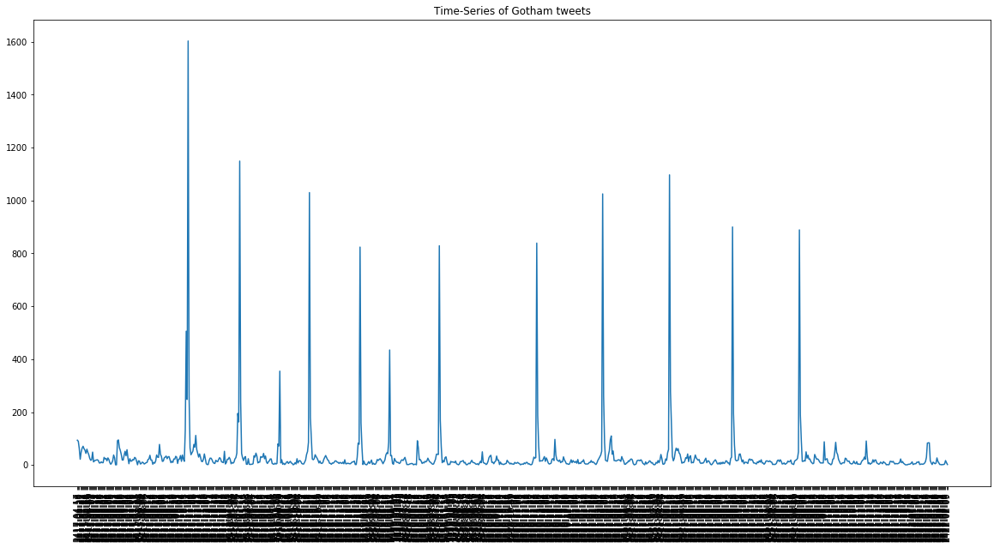

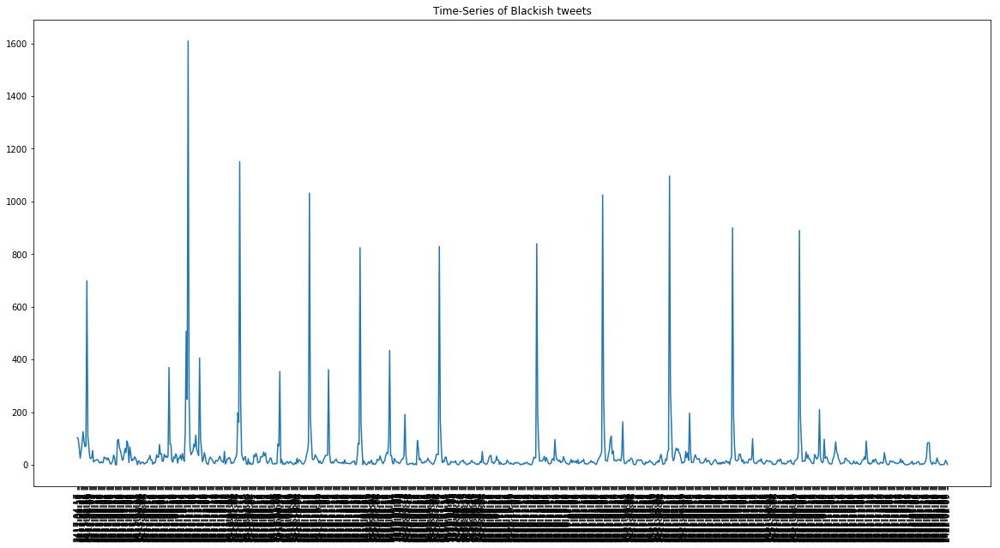

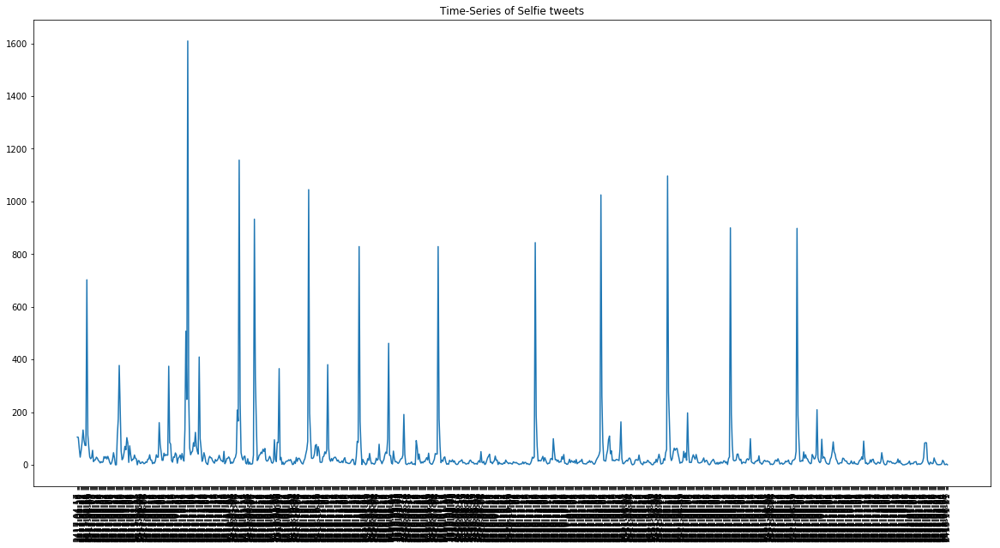

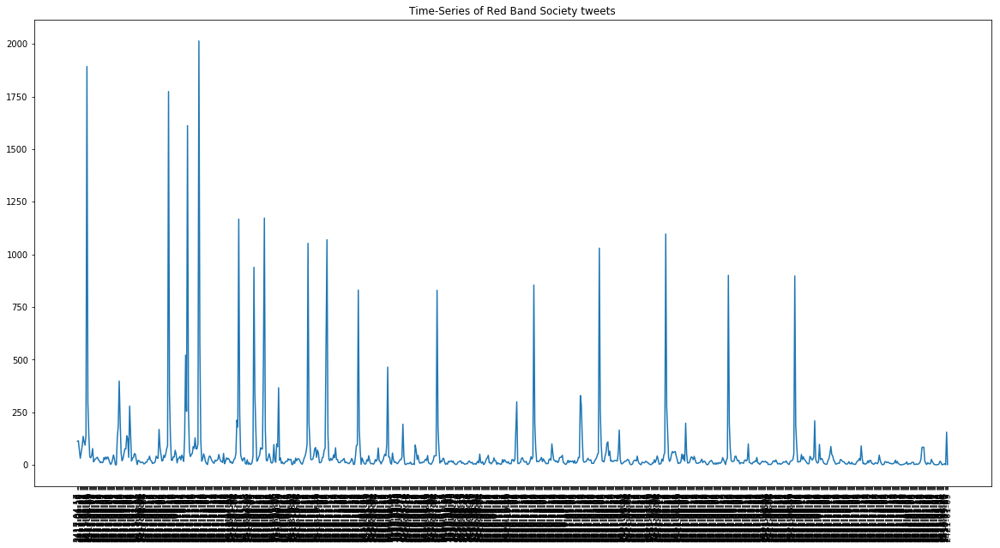

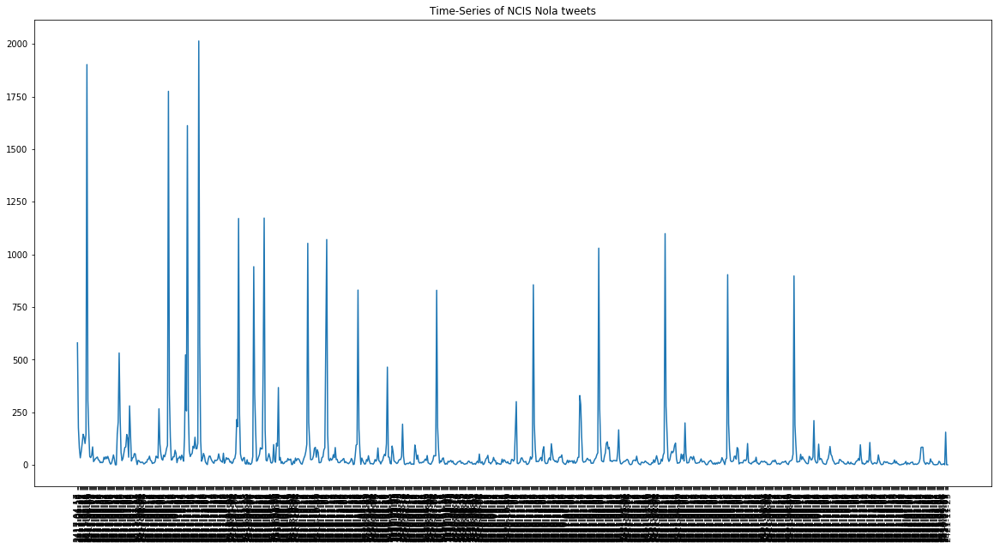

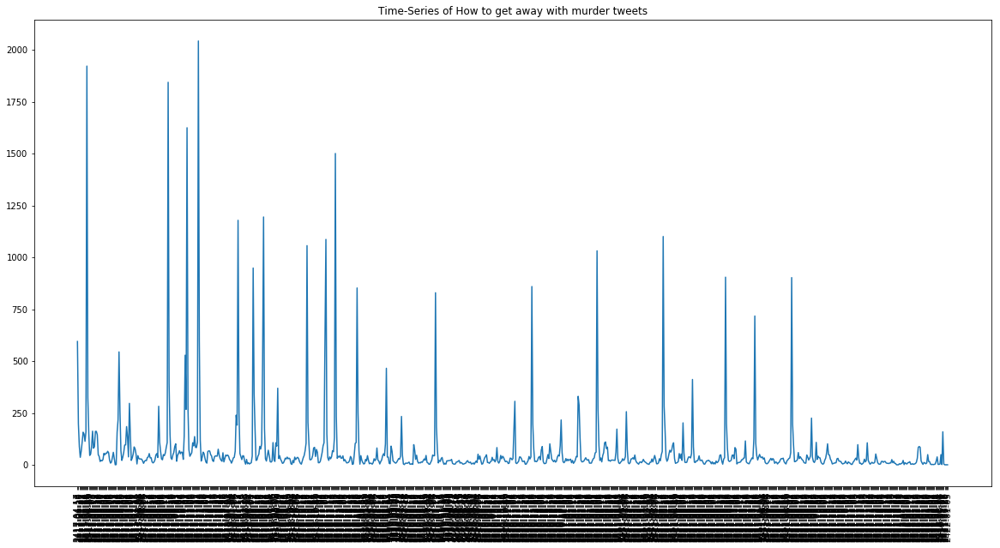

In [17]:
regex = re.compile('.*@.*', re.IGNORECASE)
date_data = {}
i = 1
for source in data_source:
    count = 0
    for record in source.find({'text' : regex}):
        
        tweet = str(record['text'])
        tweet_words = tweet.split(" ")
        if "@" in tweet_words[0]:
            timestamp = int(record['timestamp_ms'])/100
            date_time = datetime.utcfromtimestamp(timestamp).strftime('%Y-%m-%d %H:%M:%S')
            date = date_time.split(" ")[0]
            if date in date_data:
                date_data[date] += 1
            else:
                date_data[date] = 1
            
    x_axis = date_data.keys()
    y_axis = date_data.values()
    plt.figure(1, figsize=(20, 10))
    plt.plot(x_axis, y_axis)
    if i == 1:
        plt.title("Time-Series of Gotham tweets")
    elif i == 2:
        plt.title("Time-Series of Blackish tweets")
    elif i == 3:
        plt.title("Time-Series of Selfie tweets")
    elif i == 4:
        plt.title("Time-Series of Red Band Society tweets")
    elif i == 5:
        plt.title("Time-Series of NCIS Nola tweets")
    elif i == 6:
        plt.title("Time-Series of How to get away with murder tweets")

    plt.xticks(rotation=90)
    
    i += 1
    plt.show()

## Word cloud of all the users
Creating a visualization of all the major players in the network.

In [18]:
def build_wordcloud(tweet_list, name):
    wordcloud = WordCloud(max_words=200, width=1000, height=600).generate(tweet_list)
    plt.figure( figsize=(15,8), facecolor='k')
    plt.imshow(wordcloud,interpolation='bilinear')
    plt.axis("off")
    plt.tight_layout(pad=0)
    plt.title("Word Cloud of " + str(name))
    plt.show()


## Creating a network for interactions happening in all tv shows
A retweet network is the network. This program creates a dictionary in the form of 
user : {all users mentioned : count of number of timed mentioned/ replied/ retweet}
The dictionary is then used to create the network graph and word cloud.

Word Cloud for gotham show


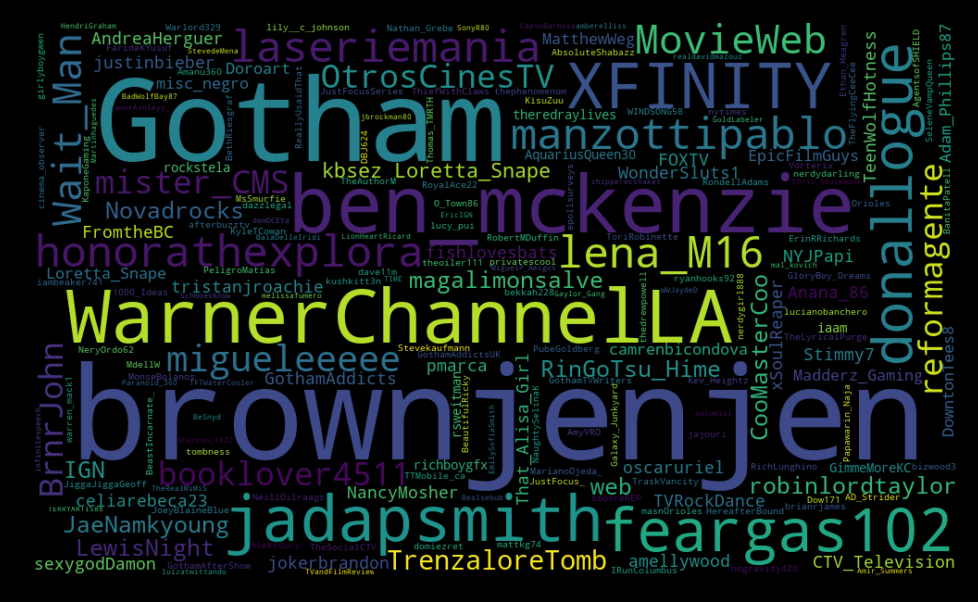

Word Cloud for blackish show


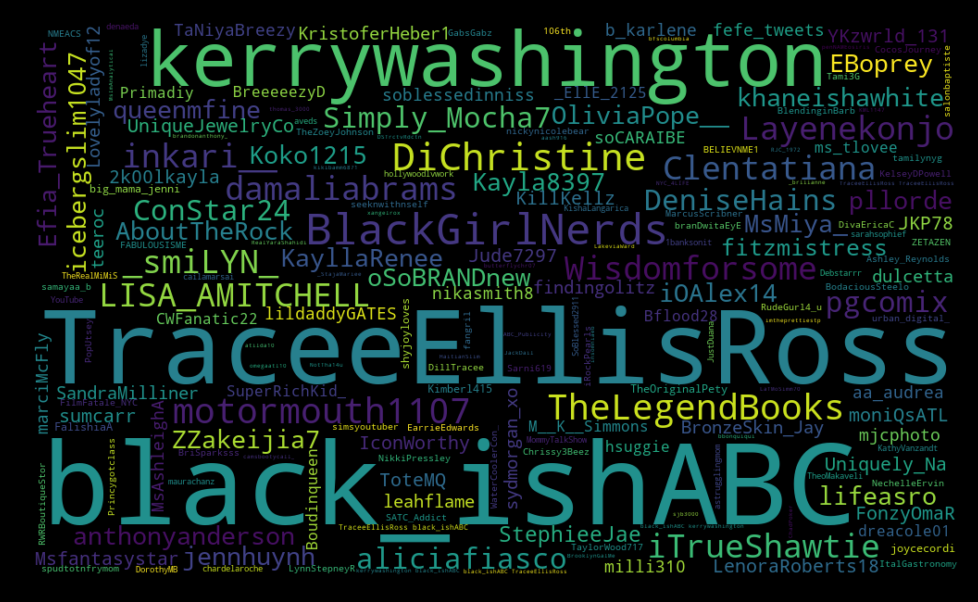

Word Cloud for selfie show


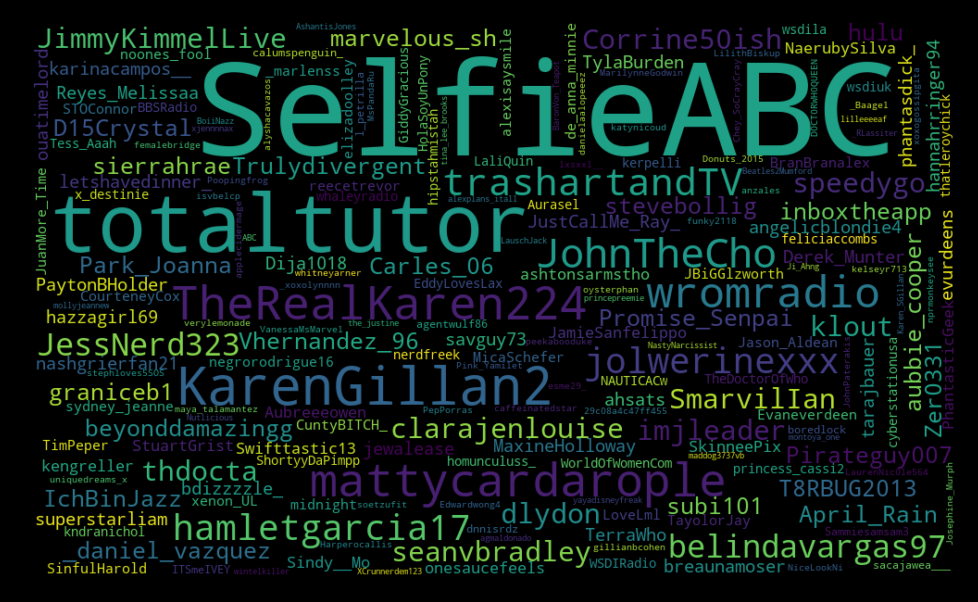

Word Cloud for red_band_society show


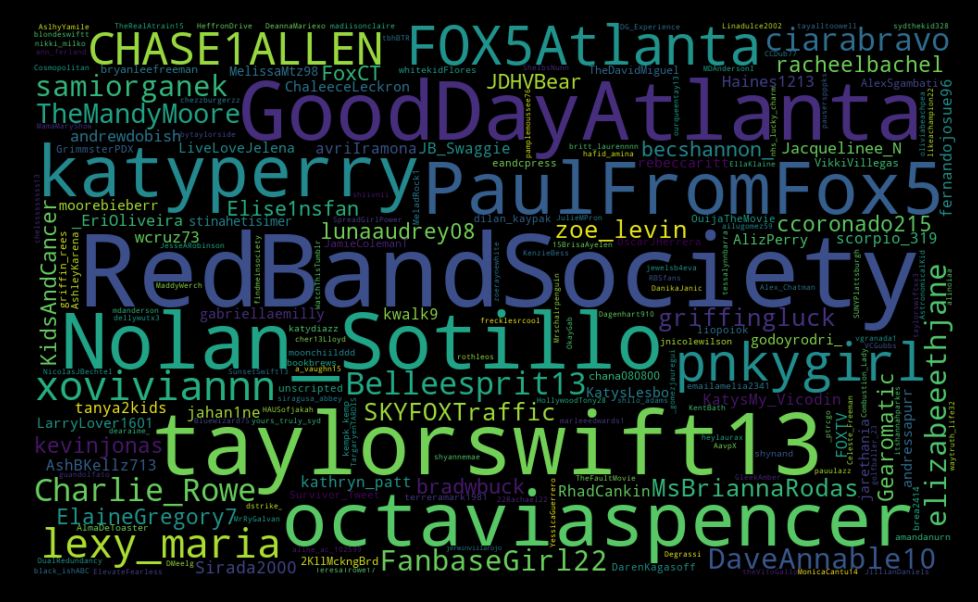

Word Cloud for ncis_nola show


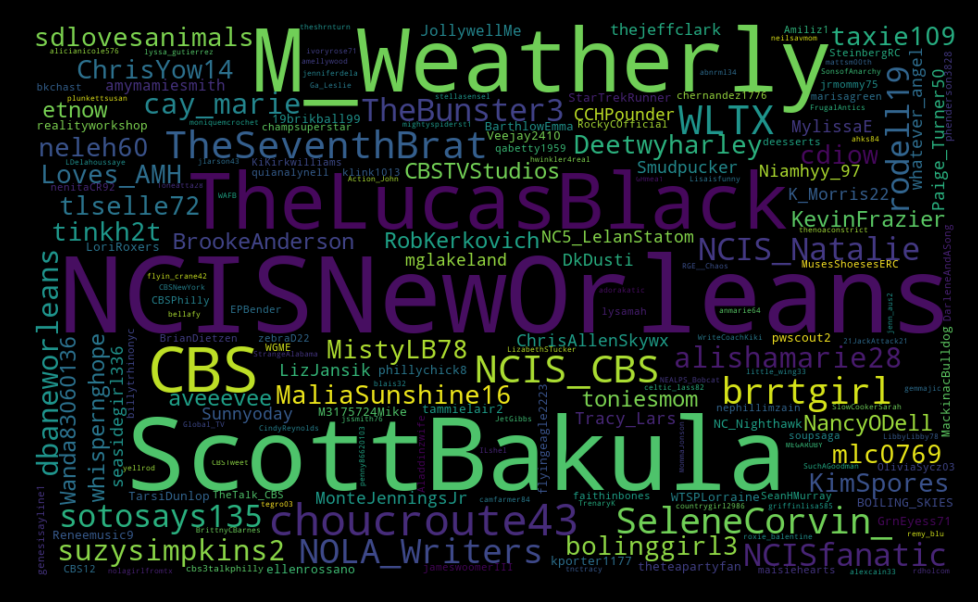

Word Cloud for how_to_get_away show


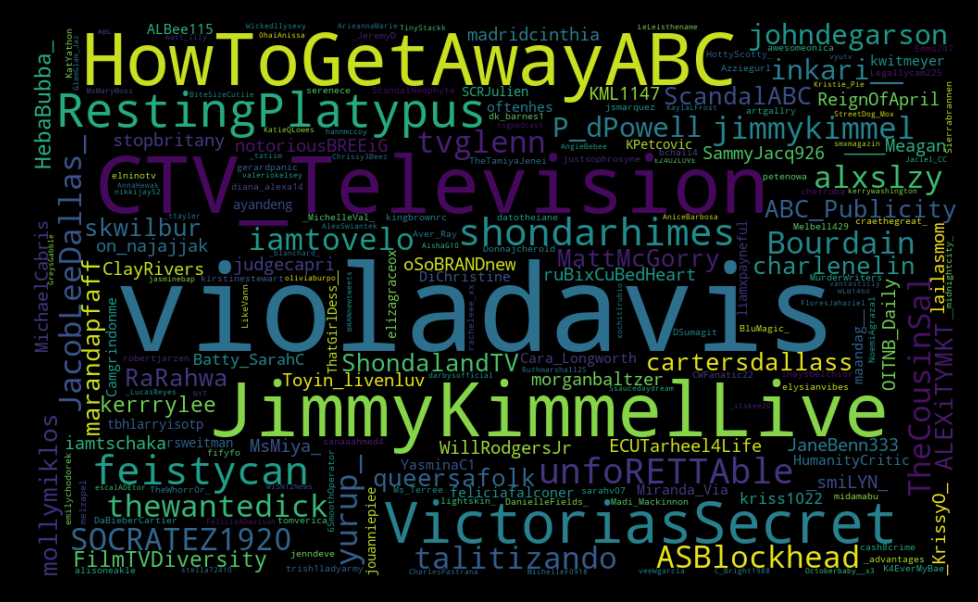

In [19]:
regex = re.compile('.*@.*', re.IGNORECASE)
j = 0
names = ['gotham', 'blackish', 'selfie', 'red_band_society', 'ncis_nola', 'how_to_get_away']
gotham_dict, blackish_dict, selfie_dict, red_band_society_dict, ncis_nola_dict, how_to_get_away_dict = (defaultdict() 
                                                                                         for i in range(6))
for source in data_source:
    retweet_dict = defaultdict()
    tweet_list = ""
    date_data = {}
    count = 0

    for record in source.find({'text' : regex}).limit(200):
        count += 1    
        mentions = record['entities']['user_mentions']
        user_name = str(record['user']['screen_name'])

        for i in range(len(mentions)):
            user_mentioned = mentions[i]['screen_name']
            if user_name in retweet_dict:
                check = "False"
                for i in range(len(retweet_dict[user_name])):
                    if user_mentioned in retweet_dict[user_name][i]:
                        retweet_dict[user_name][i][1] += 1
                        check = True
                if check == "False":
                    retweet_dict[user_name].append([user_mentioned, 1]) 
            else:
                retweet_dict[user_name] = []
                retweet_dict[user_name].append([user_mentioned, 1]) 
           
         # Collecting tweets for word cloud#
            tweet_list = tweet_list + user_name + " " + user_mentioned + " "
        # Time Stamp Dictionary #
        timestamp = int(record['timestamp_ms'])/1000
        date_time = datetime.utcfromtimestamp(timestamp).strftime('%Y-%m-%d %H:%M:%S')
        date = date_time.split(" ")[0]
        if date in date_data:
            date_data[date] += 1
        else:
            date_data[date] = 1
     
        
    #print(count)
    vertices = retweet_dict.keys()
    edge_nodes = []
    node = {}
    for key, value in retweet_dict.items():
        for i in range(len(key)):
            node[i] = key
        for i in range(len(value)):
            weight_matrix = (key, value[i][0], value[i][1])
            edge_nodes.append(weight_matrix)
    name = names[j]
    print("Word Cloud for " + name + " show")
    build_wordcloud(tweet_list, name)
    j += 1
    if name == 'gotham':
        gotham_dict = retweet_dict
    elif name == 'blackish':
        blackish_dict = retweet_dict
    elif name == 'selfie':
        selfie_dict = retweet_dict
    elif name == 'red_band_society':
        red_band_society_dict = retweet_dict
    elif name == 'ncis_nola':
        ncis_nola_dict = retweet_dict
    elif name == 'how_to_get_away':
        how_to_get_away_dict = retweet_dict

         
        

### Different measures for the network graph to understand who are important players in the information flow.
There can be various ways in which a user can be important for example, a user who is connected to many other nodes is a source of imformation and a user lying between many shortest path can be a major player in enabling fastest information flow.


#### 1. Network Information
Extracting information for network like number of nodes, number of edges and number of self loops.
Here number of nodes are number of users in the network, number of edges are the interactions between different users and self loops are number of times a user interacted with itself for ex. a user retweeting its own tweet.

In [20]:
def network_info(network_graph, name):
    num_nodes = network_graph.number_of_nodes()
    num_edges = network_graph.number_of_edges()
    num_self_loop = network_graph.number_of_selfloops()
    print("Number of self loops: " + str(num_self_loop))
    print(f"There are {network_graph.number_of_nodes()} nodes and {network_graph.number_of_edges()} edges present.")

#### 2. EigenVector Centrality
Measures of one’s connection to those who are highly connected.
Eigenvector centrality computes the centrality for a node based on the centrality of its neighbors. 

In [21]:
def eigen_vector(network_graph, name):
    dict_eigenvector_centrality = nx.eigenvector_centrality_numpy(network_graph)
    sorted_out_eigenvector = sorted(dict_eigenvector_centrality.items(), key=itemgetter(1), reverse=True)
    print("Eigen vector centrality of top 5 nodes for " + name + " :")
    for d in sorted_out_eigenvector[:5]:
        print(d)

#### 3. Closeness
Compute closeness centrality for nodes.

Closeness centrality of a node u is the reciprocal of the average shortest path distance to u over all n-1 reachable nodes.

𝐶(𝑢)=𝑛−1∑𝑛−1𝑣=1𝑑(𝑣,𝑢)

where d(v, u) is the shortest-path distance between v and u, and n is the number of nodes that can reach u. Notice that the closeness distance function computes the incoming distance to u for directed graphs. 
Notice that higher values of closeness indicate higher centrality.


In [22]:
def closeness(network_graph, name):
    dict_closeness_centrality = nx.closeness_centrality(network_graph)
    sorted_out_closeness = sorted(dict_closeness_centrality.items(), key=itemgetter(1), reverse=True)
    print("closeness of top 5 nodes for " + name + " :")

    for d in sorted_out_closeness[:5]:
        print(d)

#### 4. In-degree and Out-degree Measures
The degree centrality for a node v is the fraction of nodes it is connected to.
The in-degree centrality for a node v is the fraction of nodes its incoming edges are connected to.
The out-degree centrality for a node v is the fraction of nodes its outgoing edges are connected to.

In [23]:
def in_degree(network_graph, name):
    density = nx.density(network_graph)
    print("Network density of network for " + name + " :", density)
    #print("Information: ", nx.info(g_blackish))

    dict_degree_centrality = nx.degree_centrality(network_graph)
    print("Degree centrallity of top 5 nodes for " + name + " :")
    sorted_out_degree = sorted(dict_degree_centrality.items(), key=itemgetter(1), reverse=True)
    for d in sorted_out_degree[:5]:
        print(d)


    out_deg_blackish = network_graph.out_degree(network_graph.nodes())
    nx.set_node_attributes(network_graph, out_deg_blackish, 'out_degree')
    sorted_out_degree = sorted(out_deg_blackish, key=lambda tup:tup[1], reverse=True)
    print("Out degree centrality of top 5 nodes for " + name + " :")
    for d in sorted_out_degree[:5]:
        print(d)

    in_deg_blackish = network_graph.in_degree(network_graph.nodes())
    nx.set_node_attributes(network_graph, in_deg_blackish, 'in_degree')
    sorted_in_degree = sorted(in_deg_blackish, key=lambda tup:tup[1], reverse=True)
    print("In degree centrality of top 5 nodes for " + name +" :")
    for d in sorted_in_degree[:5]:
        print(d)

#### 5. Betweenness Centrality
Compute the shortest-path betweenness centrality for nodes. 
Betweenness centrality of a node 𝑣 is the sum of the fraction of all-pairs shortest paths that pass through 𝑣

𝑐𝐵(𝑣)=∑𝑠,𝑡∈𝑉𝜎(𝑠,𝑡|𝑣)𝜎(𝑠,𝑡)
where 𝑉 is the set of nodes, 𝜎(𝑠,𝑡) is the number of shortest (𝑠,𝑡)-paths, and 𝜎(𝑠,𝑡|𝑣) is the number of those paths passing through some node 𝑣 other than 𝑠,𝑡. If 𝑠=𝑡, 𝜎(𝑠,𝑡)=1, and if 𝑣∈𝑠,𝑡, 𝜎(𝑠,𝑡|𝑣)=0.

In [24]:
def between(network_graph, name):
    between_cent_blackish = nx.betweenness_centrality(network_graph)
    print("Between-ness centrallity of top 5 nodes in " + name + " :")
    sorted_betweenness = sorted(between_cent_blackish.items(), key=itemgetter(1), reverse=True)
    for d in sorted_betweenness[:5]:
        print(d)

#### 6. Page Rank Algorithm
PageRank computes a ranking of the nodes in the graph G based on the structure of the incoming links. It was originally designed as an algorithm to rank web pages.

Difference from Eigen Vector Centrality:
The eigenvector calculation is done by the power iteration method and has no guarantee of convergence. The iteration will stop after max_iter iterations or an error tolerance of number_of_nodes(G)*tol has been reached.

The PageRank algorithm was designed for directed graphs but this algorithm does not check if the input graph is directed and will execute on undirected graphs by converting each edge in the directed graph to two edges.


In [25]:
def page_rank(graph, name):
    page_rank = nx.pagerank(graph, alpha=0.9)
    sorted_page_rank = sorted(page_rank.items(), key=itemgetter(1), reverse=True)
    print("Top 5 nodes by Page Rank for " + name + " tv show:")
    for d in sorted_page_rank[:5]:
        print(d)


## Network graph for Gotham
Creating network graph using networksx, with the dictionary created for each tv-show comprising the interactions that happend between nodes.

Network Graph for Gotham dataset


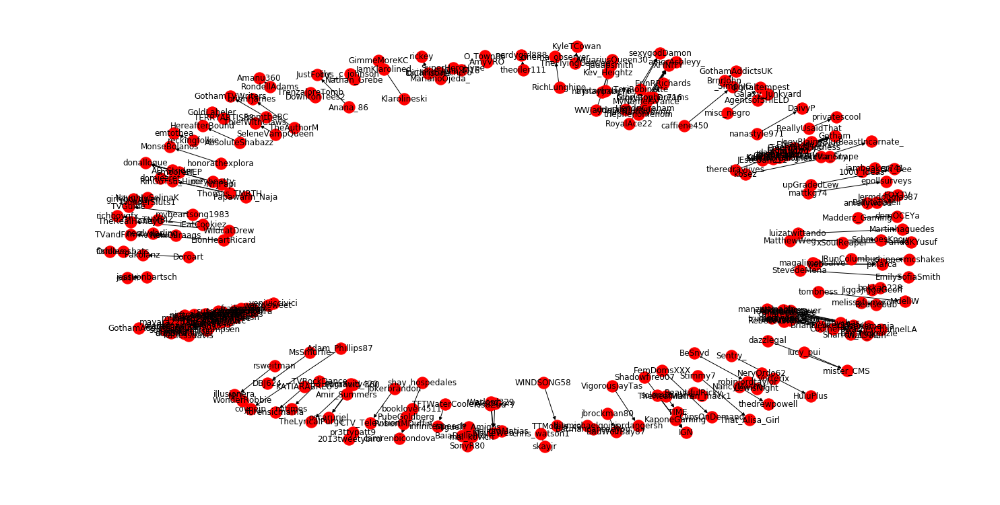

Number of self loops: 1
There are 284 nodes and 192 edges present.
Eigen vector centrality of top 5 nodes for Gotham :
('Loretta_Snape', 1.0)
('WarnerChannelLA', 1.9395488286095267e-17)
('sexygodDamon', 1.4320756104339444e-17)
('NeryOrdo62', 1.3473979611721705e-17)
('RinGoTsu_Hime', 1.2978455323532967e-17)
closeness of top 5 nodes for Gotham :
('brownjenjen', 0.13780918727915195)
('Gotham', 0.053003533568904596)
('WarnerChannelLA', 0.0353356890459364)
('ben_mckenzie', 0.03180212014134275)
('XFINITY', 0.024734982332155476)
Network density of network for Gotham : 0.0023888916538097847
Degree centrallity of top 5 nodes for Gotham :
('brownjenjen', 0.13780918727915195)
('Gotham', 0.053003533568904596)
('WarnerChannelLA', 0.0353356890459364)
('ben_mckenzie', 0.03180212014134275)
('XFINITY', 0.024734982332155476)
Out degree centrality of top 5 nodes for Gotham :
('AD_Strider', 1)
('Warlord329', 1)
('CooMasterCoo', 1)
('NeryOrdo62', 1)
('tristanjroachie', 1)
In degree centrality of top 5 node

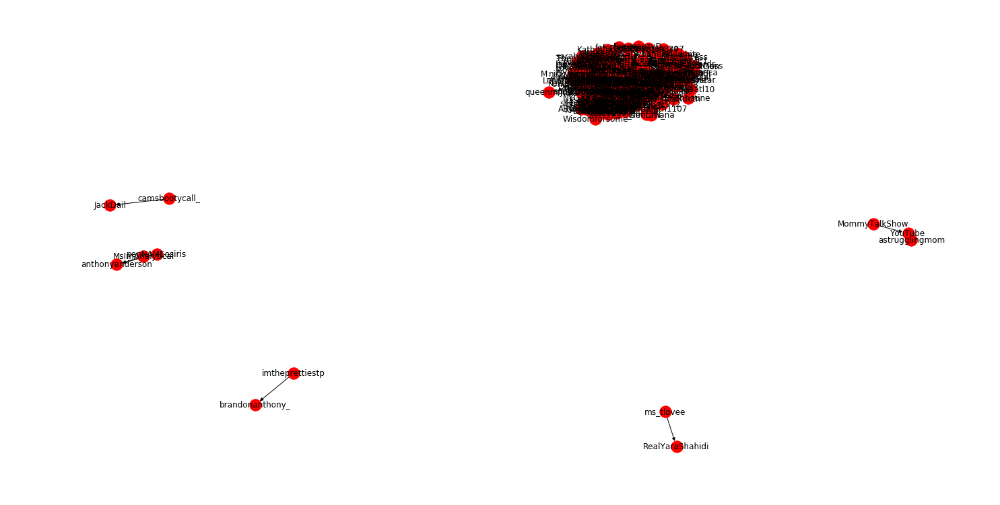

Number of self loops: 0
There are 186 nodes and 180 edges present.
Eigen vector centrality of top 5 nodes for Blackish :
('black_ishABC', 0.9999999999941301)
('brandonanthony_', 2.016839819045167e-06)
('JackDail', 1.5839186097891025e-06)
('kerrywashington', 9.58147063955948e-07)
('MarcusScribner', 8.328200591438964e-07)
closeness of top 5 nodes for Blackish :
('black_ishABC', 0.8840348545266579)
('kerrywashington', 0.02702702702702703)
('TraceeEllisRoss', 0.016216216216216217)
('anthonyanderson', 0.010810810810810811)
('YouTube', 0.010810810810810811)
Network density of network for Blackish : 0.0052310374891020054
Degree centrallity of top 5 nodes for Blackish :
('black_ishABC', 0.8810810810810812)
('kerrywashington', 0.032432432432432434)
('TraceeEllisRoss', 0.021621621621621623)
('MarcusScribner', 0.010810810810810811)
('anthonyanderson', 0.010810810810810811)
Out degree centrality of top 5 nodes for Blackish :
('LaTMoSimm70', 1)
('TraceeEllisRoss', 1)
('nickynicolebear', 1)
('inkari

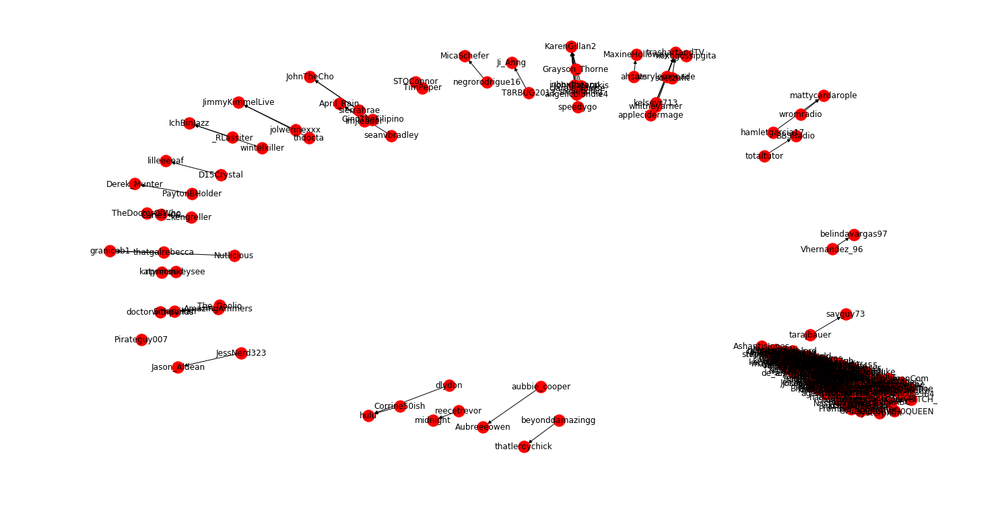

Number of self loops: 2
There are 211 nodes and 186 edges present.
Eigen vector centrality of top 5 nodes for Selfie :
('belindavargas97', 0.9965247886971131)
('Carles_06', 4.5520265736133035e-17)
('seanvbradley', 3.125494758574645e-17)
('LaurenNic0le564', 2.5366494992001187e-17)
('BoiiNazz', 2.4221268752556145e-17)
closeness of top 5 nodes for Selfie :
('SelfieABC', 0.6571428571428571)
('KarenGillan2', 0.03333333333333333)
('trashartandTV', 0.02857142857142857)
('SmarvilIan', 0.014285714285714285)
('April_Rain', 0.009523809523809525)
Network density of network for Selfie : 0.004197698036560595
Degree centrallity of top 5 nodes for Selfie :
('SelfieABC', 0.6571428571428573)
('KarenGillan2', 0.03333333333333334)
('trashartandTV', 0.028571428571428574)
('belindavargas97', 0.014285714285714287)
('SmarvilIan', 0.014285714285714287)
Out degree centrality of top 5 nodes for Selfie :
('marvelous_sh', 1)
('jewalease', 1)
('stevebollig', 1)
('evurdeens', 1)
('ouatimelord', 1)
In degree centrali

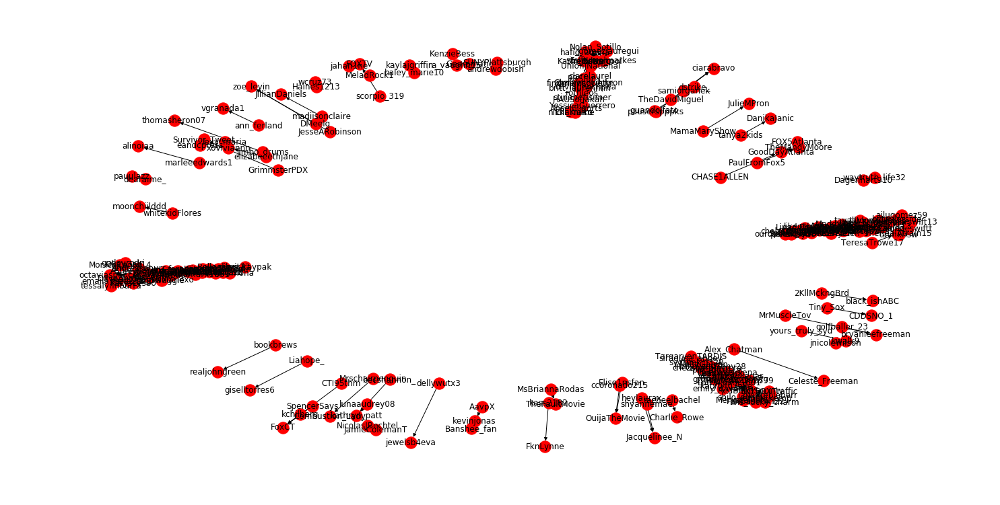

Number of self loops: 3
There are 217 nodes and 173 edges present.
Eigen vector centrality of top 5 nodes for Red Band Society :
('Haines1213', 0.4531569304885376)
('wcruz73', 0.4531569304885376)
('xoviviannn', 0.34379737337191096)
('TheFaultMovie', 1.6149038428323456e-16)
('black_ishABC', 8.231410179533045e-17)
closeness of top 5 nodes for Red Band Society :
('taylorswift13', 0.1574074074074074)
('RedBandSociety', 0.125)
('octaviaspencer', 0.12037037037037036)
('Nolan_Sotillo', 0.09722222222222222)
('TheMandyMoore', 0.014814814814814815)
Network density of network for Red Band Society : 0.0036909028844512716
Degree centrallity of top 5 nodes for Red Band Society :
('taylorswift13', 0.15740740740740738)
('RedBandSociety', 0.125)
('octaviaspencer', 0.12037037037037036)
('Nolan_Sotillo', 0.09722222222222221)
('xoviviannn', 0.018518518518518517)
Out degree centrality of top 5 nodes for Red Band Society :
('Sirada2000', 1)
('ElevateFearless', 1)
('britt_laurennnn', 1)
('_EriOliveira', 1)
(

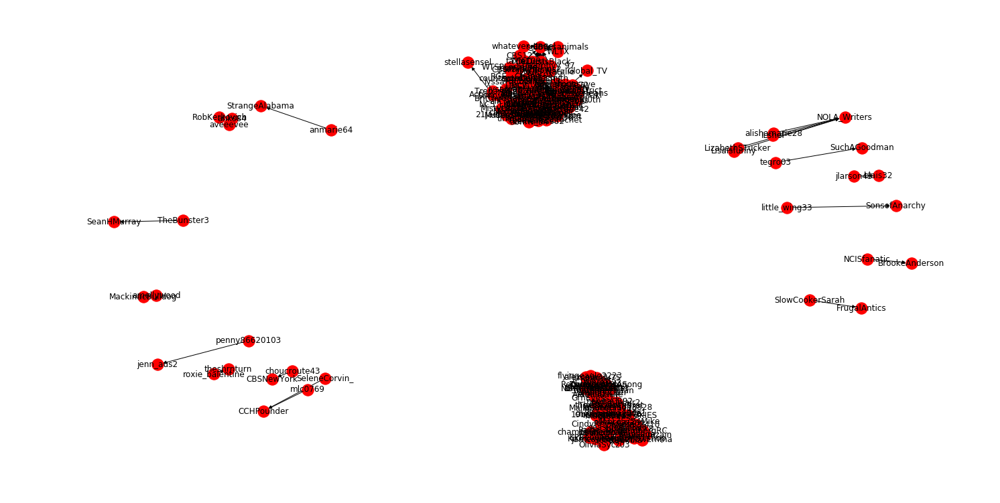

Number of self loops: 1
There are 175 nodes and 158 edges present.
Eigen vector centrality of top 5 nodes for How to get away with murder :
('CBS', 1.0)
('ScottBakula', 3.0111543558939266e-17)
('nolagirlfromtx', 1.773384723848989e-17)
('countrygirl2986', 1.5265735602061037e-17)
('NCIS_CBS', 1.2659258222673925e-17)
closeness of top 5 nodes for How to get away with murder :
('ScottBakula', 0.3103448275862069)
('CBS', 0.27406863943914567)
('NCISNewOrleans', 0.2471264367816092)
('TheLucasBlack', 0.06896551724137931)
('NCIS_CBS', 0.022988505747126436)
Network density of network for How to get away with murder : 0.005188834154351396
Degree centrallity of top 5 nodes for How to get away with murder :
('ScottBakula', 0.3103448275862069)
('NCISNewOrleans', 0.25287356321839083)
('CBS', 0.14367816091954022)
('TheLucasBlack', 0.07471264367816091)
('NCIS_CBS', 0.028735632183908046)
Out degree centrality of top 5 nodes for How to get away with murder :
('TheSeventhBrat', 1)
('RGE__Chaos', 1)
('TheLu

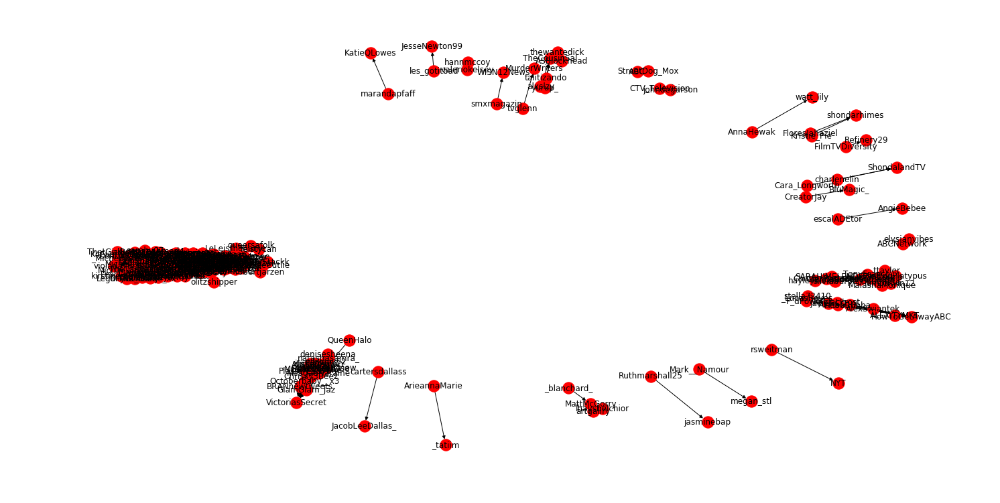

Number of self loops: 1
There are 215 nodes and 191 edges present.
Eigen vector centrality of top 5 nodes for NCIS-New Orleans :
('JacobLeeDallas_', 1.0)
('SOCRATEZ1920', 1.019668927699966e-16)
('RestingPlatypus', 6.735991398049377e-17)
('TheCousinSal', 5.151690116481164e-17)
('watt_lily', 3.741278120176495e-17)
closeness of top 5 nodes for NCIS-New Orleans :
('violadavis', 0.5298403120170726)
('VictoriasSecret', 0.08878504672897196)
('RestingPlatypus', 0.06074766355140187)
('HowToGetAwayABC', 0.04205607476635514)
('TheCousinSal', 0.02336448598130841)
Network density of network for NCIS-New Orleans : 0.004151271462725495
Degree centrallity of top 5 nodes for NCIS-New Orleans :
('violadavis', 0.5280373831775701)
('VictoriasSecret', 0.08878504672897196)
('RestingPlatypus', 0.06074766355140186)
('HowToGetAwayABC', 0.04205607476635514)
('TheCousinSal', 0.02336448598130841)
Out degree centrality of top 5 nodes for NCIS-New Orleans :
('JimmyKimmelLive', 1)
('SammyJacq926', 1)
('veeWgarcia', 

In [26]:
dicts = [gotham_dict, blackish_dict, selfie_dict, red_band_society_dict, ncis_nola_dict, how_to_get_away_dict]
names = ["Gotham", "Blackish", "Selfie", "Red Band Society", "NCIS - New Orleans", "How to get away with murder"]
n_count, count = 0, 0

# Creating network graph for each tv-show and calculating centrality metrics

for retweeted_dict in dicts:
    
    name = names[n_count]
    print("Network Graph for " + name + " dataset")
    graph= nx.DiGraph()                                    # Creating Directed Network graph
    for key in retweeted_dict:
        user = key
        interactions = retweeted_dict[key]
        #print(interactions)
        for i in range(len(interactions)):
            retweeted = interactions[i][0]
            num_times = interactions[i][1]
        graph.add_edge(user, retweeted, weight=num_times)
    nx.draw(graph, with_labels=True)
    fig = plt.gcf()
    fig.set_size_inches(20,10)
    plt.show()    
    

    if count == 0:
        name = "Gotham"
    elif count == 1:
        name = "Blackish"
    elif count == 2:
        name = "Selfie"
    elif count == 3:
        name = "Red Band Society"
    elif count == 4:
        name = "How to get away with murder"
    elif count == 5:
        name = "NCIS-New Orleans"
    
    
    network_info(graph, name) 
    eigen_vector(graph, name)
    closeness(graph, name)
    in_degree(graph, name)
    between(graph, name)
    
    
    if retweeted_dict==gotham_dict:
        gotham_graph = graph
    elif retweeted_dict == blackish_dict:
        blackish_graph = graph
    elif retweeted_dict == selfie_dict:
        selfie_graph = graph
    elif retweeted_dict == red_band_society_dict:
        red_band_graph = graph
    elif retweeted_dict == ncis_nola_dict:
        ncis_graph = graph
    elif retweeted_dict == how_to_get_away_dict:
        how_to_graph = graph
    
    n_count += 1
    count += 1

## Algorithms for Community Detection
Community Detection : Communities are usually groups of vertices having higher probability of being connected to each other than to members of other groups, though other patterns are possible. Identifying communities is an ill-defined problem.

#### 1. Louvain Algorithm for Community Detection 
The Louvain method of community detection is an algorithm for detecting communities in networks. It maximizes a modularity score for each community, where the modularity quantifies the quality of an assignment of nodes to communities by evaluating how much more densely connected the nodes within a community are, compared to how connected they would be in a random network.
For Evaluation of algorithm, modularity, performance and coverage are calculated.

In [27]:
def louvain_community_algo(undirect_gr, dataset):
    
    # creating partitions
    partition=community.best_partition(undirect_gr)                                        
    invert_partition = defaultdict(list)
    print('Completed Louvain algorithm .. . . ' )
    values=[partition.get(node) for node in undirect_gr.nodes()]
    list_com=partition.values()
    # Creating a dictionary like {community_number:list_of_participants}
    dict_nodes={}
    #print(partition)
    for k, v in partition.items():
        if v not in invert_partition:
            invert_partition[v] = []
        invert_partition[v].append(k)
    #print(invert_partition)
    partition_seq = []
    for k,v in invert_partition.items():
        partition_seq.append(v)
    
    # Populating the dictionary with items
    for each_item in partition.items():
        community_num=each_item[1]
        community_node=each_item[0]
        if community_num in dict_nodes:
            value=dict_nodes.get(community_num) + ' | ' + str(community_node)
            dict_nodes.update({community_num:value})
        else:
            dict_nodes.update({community_num:community_node})

    # Creating a new graph to represent the communities created by the Louvain algorithm
    mlt.rcParams['figure.figsize']= [12, 8]
    G_comm=nx.Graph()

    # Populating the data from the node dictionary created earlier
    G_comm.add_nodes_from(dict_nodes)

    # Calculating modularity and the total number of communities
    mod=community.modularity(partition,undirect_gr)
    print("Modularity: ", mod)
    print("Total number of Communities=", len(G_comm.nodes()))
    
    
    # Calculating coverage
    cover=coverage(undirect_gr, partition_seq)
    print("Community Coverage: ", cover)
    
    # Calculating Performance
    
    perf = performance(undirect_gr, partition_seq)
    print("Algorithm Performance: ", perf)
    
    # Creating the Graph and also calculating Modularity
    mlt.rcParams['figure.figsize']= [12, 8]
    pos_louvain=nx.spring_layout(G_comm)
    nx.draw_networkx(G_comm, pos_louvain, with_labels=True,node_size=160,font_size=11,
                     label='Modularity =' + str(round(mod,3)) +
                    ', Communities=' + str(len(G_comm.nodes())))
    title = "Community structure  for Louvain Algorithm for " + dataset  
    plt.suptitle(title,fontsize=22,fontname='Arial')
    plt.box(on=None)
    plt.axis('off')
    plt.legend(bbox_to_anchor=(0,1), loc='best', ncol=1)
    plt.show()
    return values, invert_partition

In [28]:
def community_graph(undirect_gr, dataset, values):
    # Starting with an initial partition of the graph and running the Louvain algorithm for Community Detection

    nx.draw_networkx(undirect_gr, cmap=plt.get_cmap('magma'), node_color=values, node_size=30, with_labels=False)
    title = "Louvain Algorithm Community Structure for " + dataset
    plt.suptitle(title,fontsize=22)
    plt.box(on=None)
    plt.axis('off')
    plt.show()

#### 2. Girvan Newman Algorithm for community detection
The Girvan Newman technique for the detection and analysis of community structure depends upon the iterative elimination of edges with the highest number of the shortest paths that pass through them. By getting rid of the edges, the network breaks down into smaller networks, i.e. communities. For Evaluation of algorithm, modularity, performance and coverage are calculated.


In [29]:
def girvan_newman_algo(undirected_gr, name):
    comp=girvan_newman(undirected_gr)
    com=0
    thisdict={}
    invert_comp = defaultdict()

    # Populating the items of the dictionary
    for c in next(comp):
        list=sorted(c)
        for i in range(len(list)):
            if list[i] in thisdict:
                print('already found')
            else:
                thisdict.update({list[i]: com})
            i+=1
        com+=1
    
    for k, v in thisdict.items():
        if v not in invert_comp:
            invert_comp[v] = []
        invert_comp[v].append(k)
    
    partition_seq = []
    for k,v in invert_comp.items():
        partition_seq.append(v)
    
    values_girvan=[thisdict.get(node) for node in undirected_gr.nodes()]
    #print(values_girvan)

    # Creating a dictionary like 'Community num':'List of participants'
    dict_nodes_girvan={}
    for each_item in thisdict.items():
        community_num=each_item[1]
        community_node=each_item[0]
    
        if community_num in dict_nodes_girvan:
            value=dict_nodes_girvan.get(community_num) + ' | ' + str(community_node)
            dict_nodes_girvan.update({community_num: value})
        else:
            dict_nodes_girvan.update({community_num: community_node})
        
    #Creating a graph where each node represents a community
    G_comm_girvan=nx.Graph()
    G_comm_girvan.add_nodes_from(dict_nodes_girvan)

    # Calculation of number of communities and modularity
    print("Total number of Communities=", len(G_comm_girvan.nodes()))
    mod_girv=community.modularity(thisdict,undirected_gr)
    print("Modularity:", mod_girv)
    
    # Calculation of coverage
    comm_coverage = coverage(undirected_gr, partition_seq)
    print("Community Coverage", comm_coverage)
    
    # Calculating performance
    perf = performance(undirected_gr, partition_seq)
    print("Algorithm Performance: ", perf)
    
    
    # Creation of the graph
    pos_girvan=nx.spring_layout(G_comm_girvan)
    nx.draw_networkx(G_comm_girvan, pos_girvan,with_labels=True,node_size=160,font_size=11, node_color='green',
                 label='Modularity =' + str(round(mod_girv,3)) +', Communities=' + str(len(G_comm_girvan.nodes())))
    
    title = name + " Community Structure (Girvan-Newman Algorithm)"
    plt.suptitle(title, fontsize=22, fontname='Arial')
    plt.box(on=None)
    plt.axis('off')
    plt.legend(bbox_to_anchor=(0,1), loc='best', ncol=1)
    plt.show()
    
    return values_girvan, invert_comp

In [30]:
def draw(undirect_gr, name, values_girvan):
    nx.draw_networkx(undirect_gr, cmap=plt.get_cmap('magma'), node_color=values_girvan, node_size=30, with_labels=False)
    title = name + " Girvan Newman Algorithm Community Structure"
    plt.suptitle(title, fontsize=22)
    plt.box(on=None)
    plt.axis('off')
    plt.show()

#### Find users active in more than one community
Sometimes there can be some communities that are overlapping communities. This program identifies the communities in which one or more than one nodes have connections to other communities as well. 

In [31]:
def overlapping_communication(partition_dict):
    overlapping_nodes = defaultdict(list)
    overlap = []
    for k,v in partition_dict.items():
        if k in overlapping_nodes:
            if v in overlapping_nodes[k]:
                overlapping_nodes[k].append(v)
                overlap.append(v)
        else:
            overlapping_nodes[k] =[]
            overlapping_nodes[k].append(v)
    if len(overlapping_nodes) > 0:
        print("Overlapping nodes are: ", len(overlap))
    else:
        print("There are no overlapping nodes.")

#### Create Community graph
The program creates a graph for community by calling functions louvain_community_algo and girvan_newman_algo implemented abouve for community detection.

Completed Louvain algorithm .. . . 
Modularity:  0.9425904010519378
Total number of Communities= 93
Community Coverage:  1.0
Algorithm Performance:  0.9755138605484497


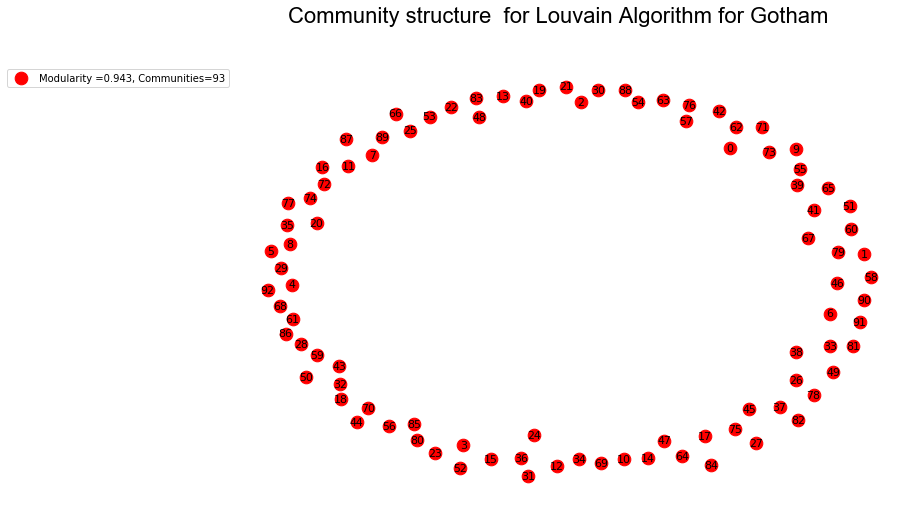

Overlapping nodes are:  0
Small communities Louvain Algorithm : 85


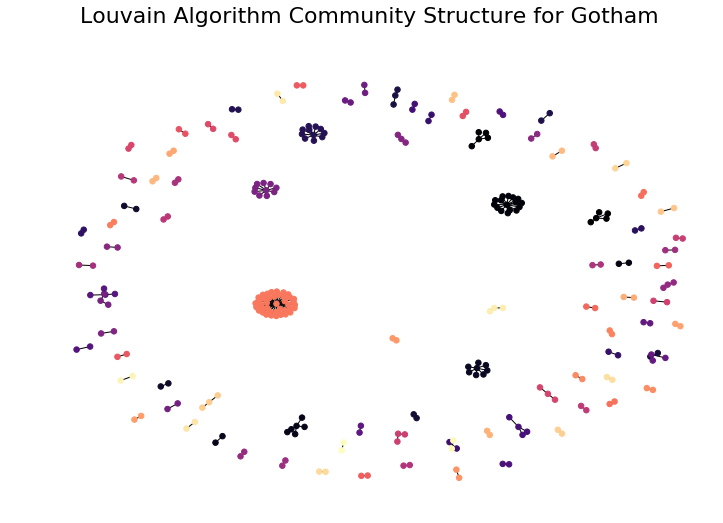

Total number of Communities= 94
Modularity: 0.9384746877054553
Community Coverage 0.9947916666666666
Algorithm Performance:  0.9764345792066889


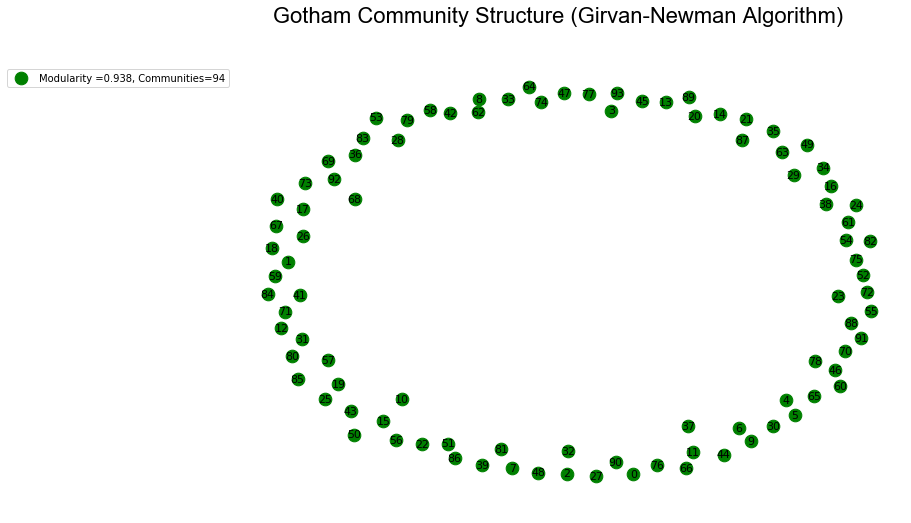

Small communities Girvan Newman Algorithm : 86
Overlapping nodes are:  0


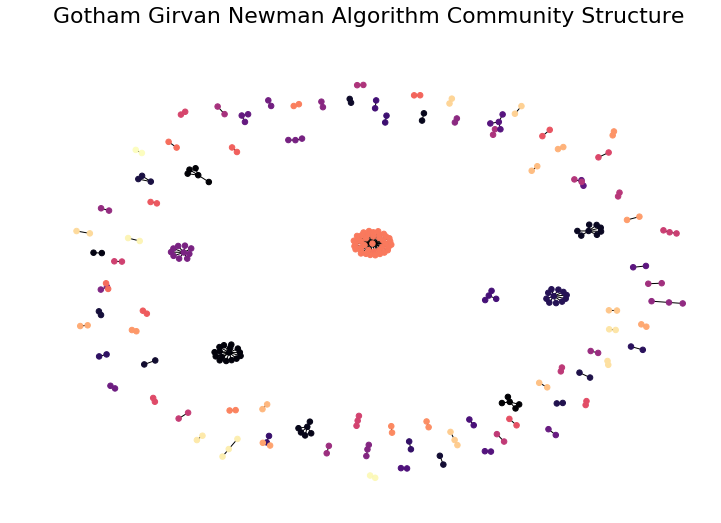

Completed Louvain algorithm .. . . 
Modularity:  0.1629423955787012
Total number of Communities= 10
Community Coverage:  0.9777777777777777
Algorithm Performance:  0.26881720430107525


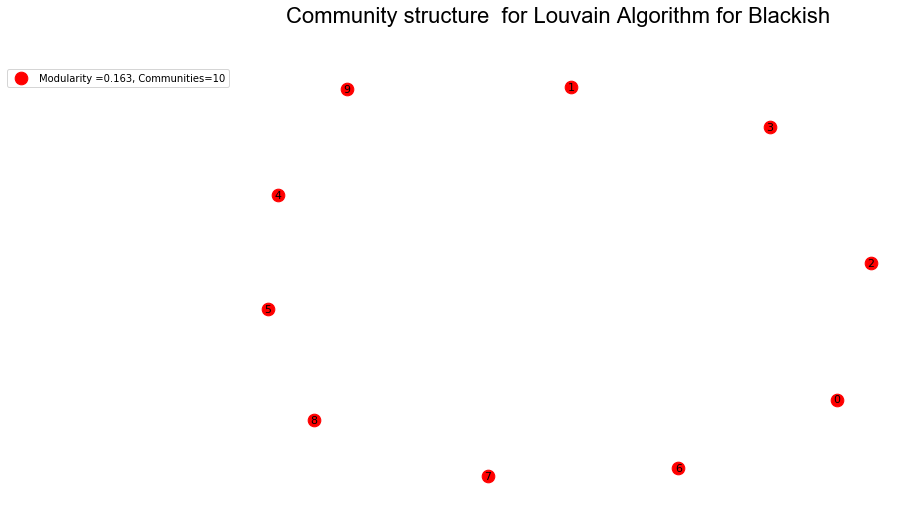

Overlapping nodes are:  0
Small communities Louvain Algorithm : 8


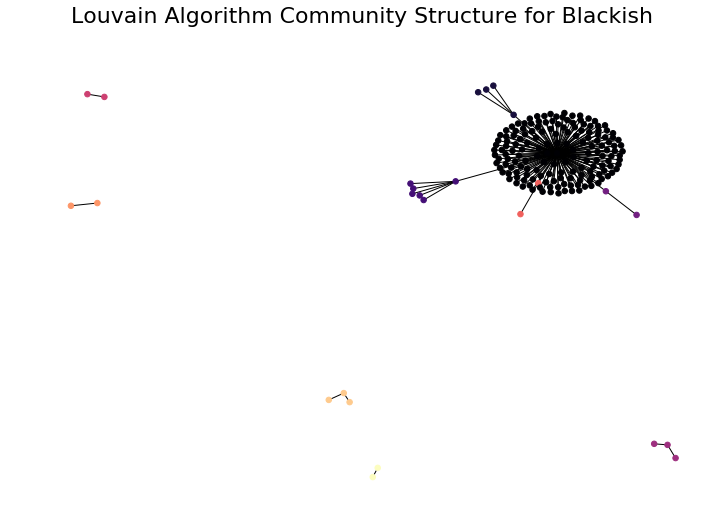

Total number of Communities= 7
Modularity: 0.11846370496333303
Community Coverage 0.9944444444444445
Algorithm Performance:  0.193606509735542


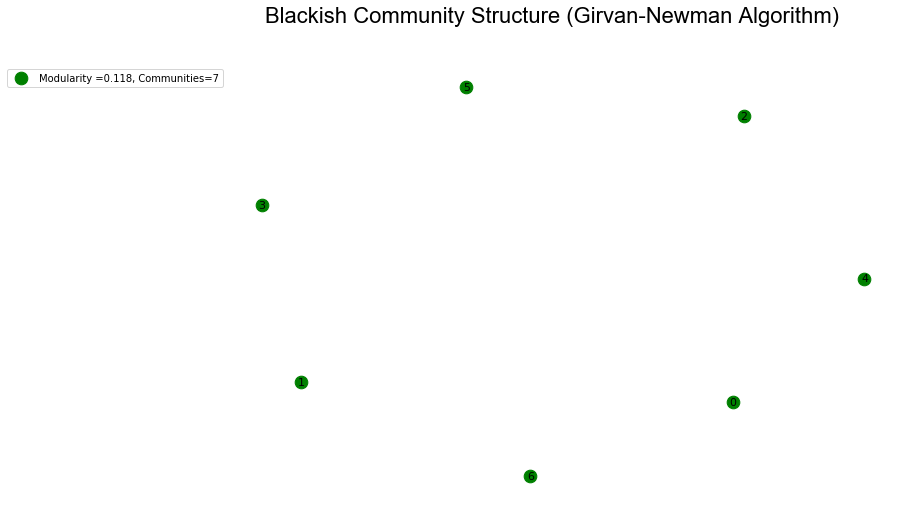

Small communities Girvan Newman Algorithm : 5
Overlapping nodes are:  0


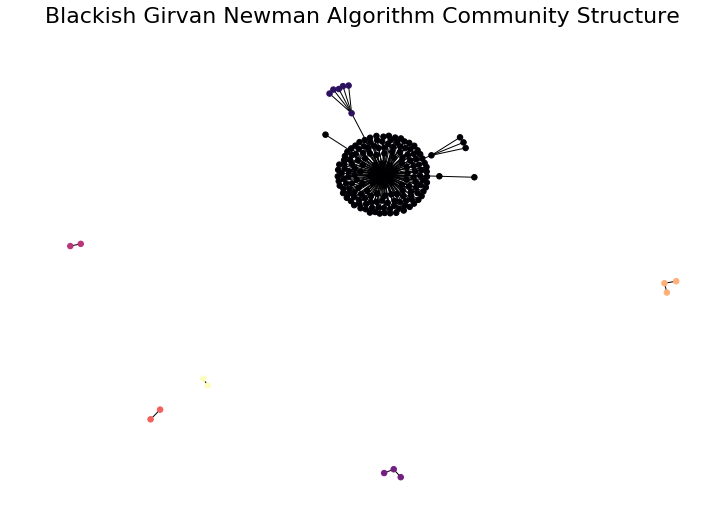

Completed Louvain algorithm .. . . 
Modularity:  0.4355143773471123
Total number of Communities= 27
Community Coverage:  1.0
Algorithm Performance:  0.5712931618144889


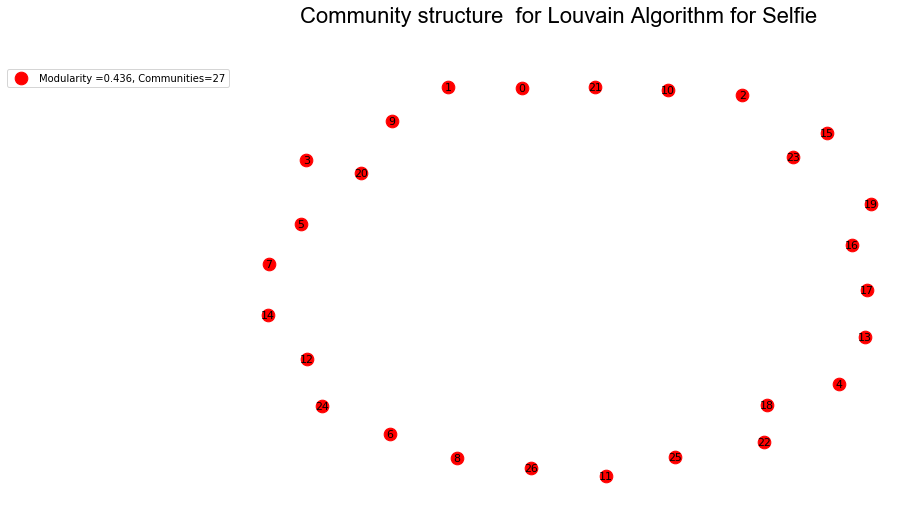

Overlapping nodes are:  0
Small communities Louvain Algorithm : 24


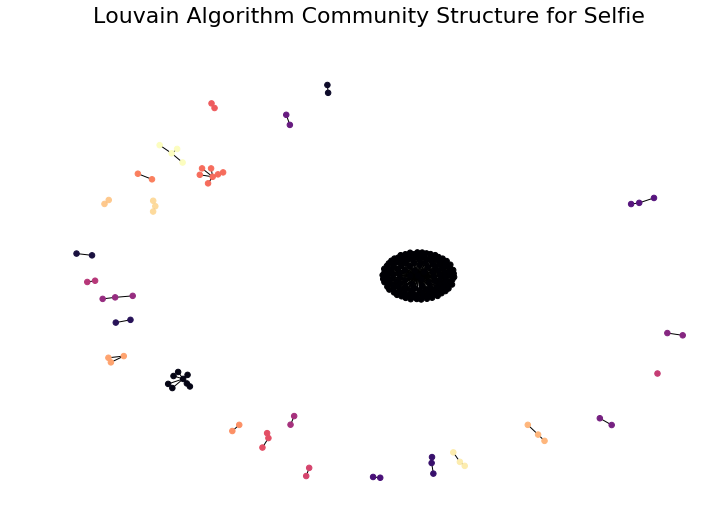

Total number of Communities= 28
Modularity: 0.43282804747676884
Community Coverage 0.9946236559139785
Algorithm Performance:  0.5774317309862333


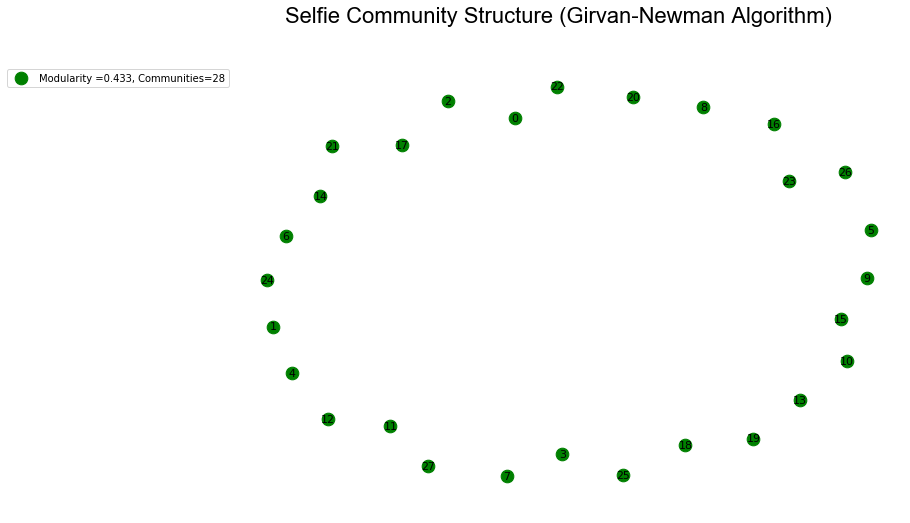

Small communities Girvan Newman Algorithm : 25
Overlapping nodes are:  0


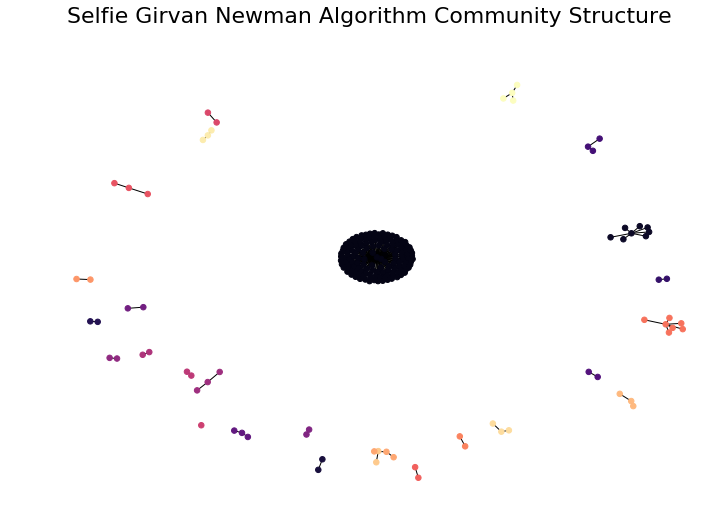

Completed Louvain algorithm .. . . 
Modularity:  0.8965408408029298
Total number of Communities= 48
Community Coverage:  1.0
Algorithm Performance:  0.9373613244580986


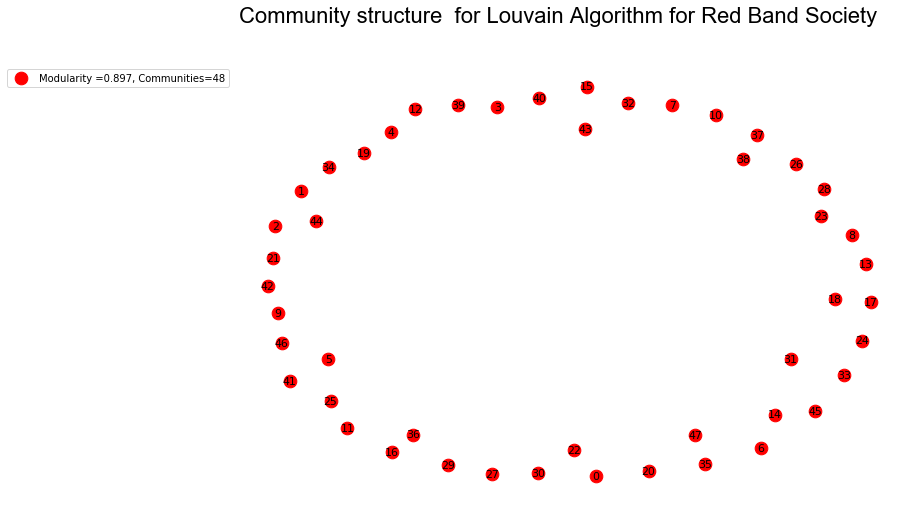

Overlapping nodes are:  0
Small communities Louvain Algorithm : 43


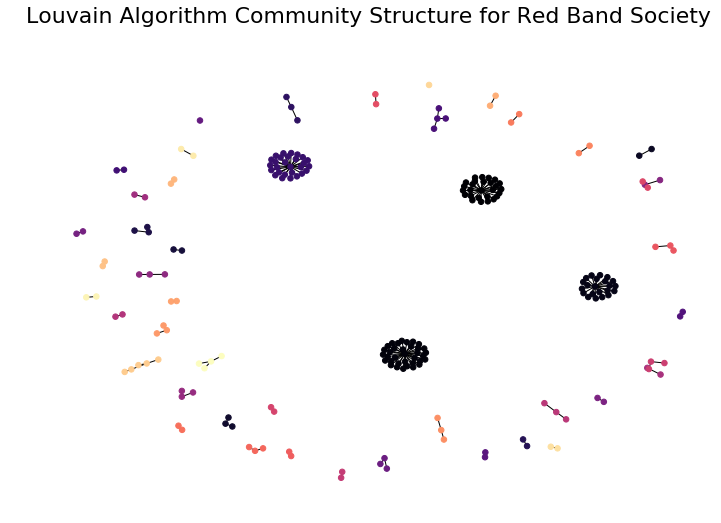

Total number of Communities= 49
Modularity: 0.8920117409418012
Community Coverage 0.9941860465116279
Algorithm Performance:  0.9387267451783581


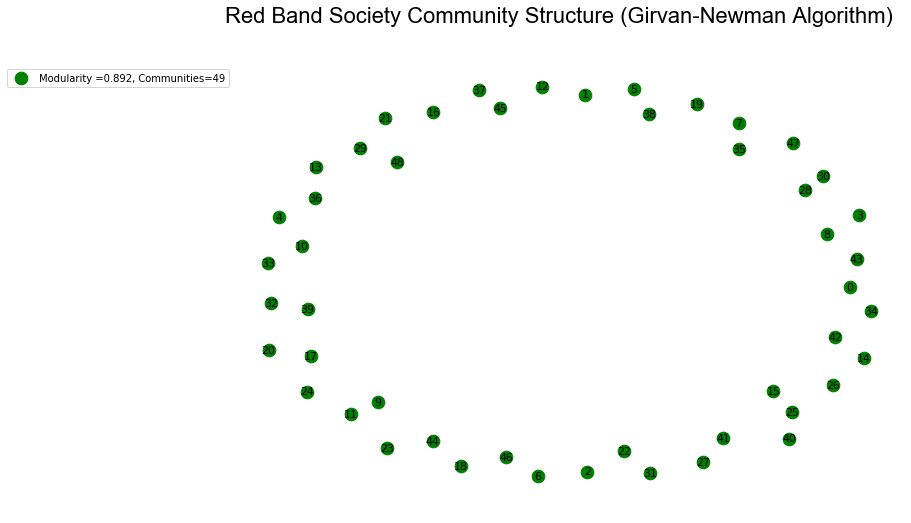

Small communities Girvan Newman Algorithm : 44
Overlapping nodes are:  0


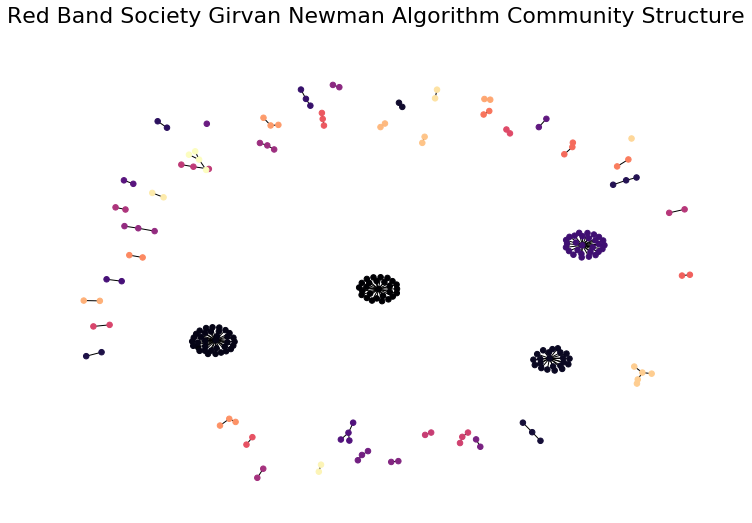

Completed Louvain algorithm .. . . 
Modularity:  0.765169286789679
Total number of Communities= 21
Community Coverage:  0.9810126582278481
Algorithm Performance:  0.8288341543513957


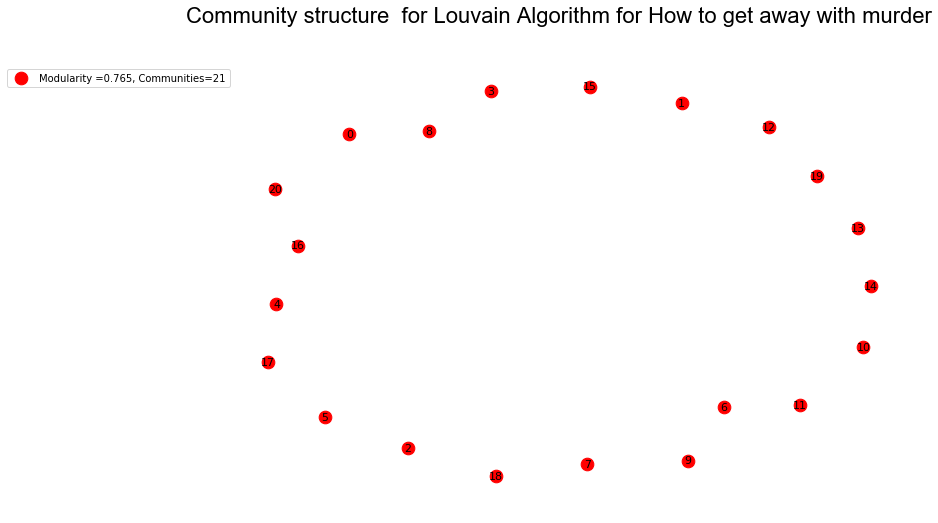

Overlapping nodes are:  0
Small communities Louvain Algorithm : 15


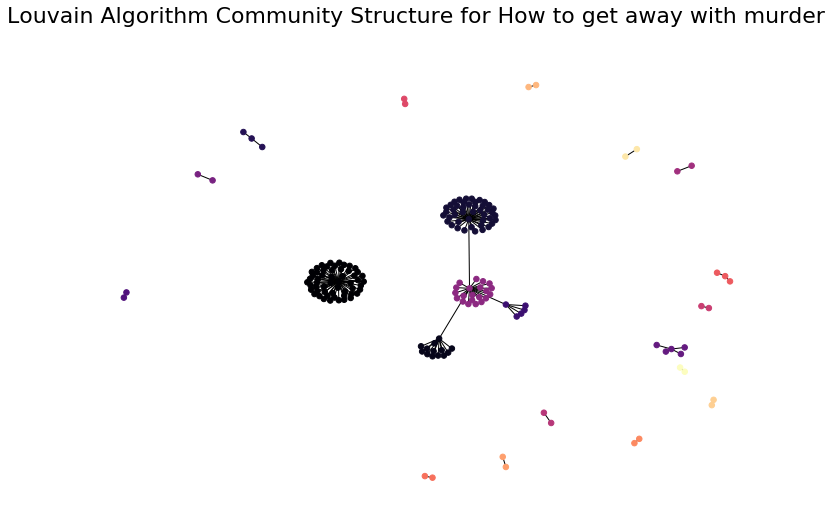

Total number of Communities= 19
Modularity: 0.7406078218549779
Community Coverage 0.9936708860759493
Algorithm Performance:  0.8


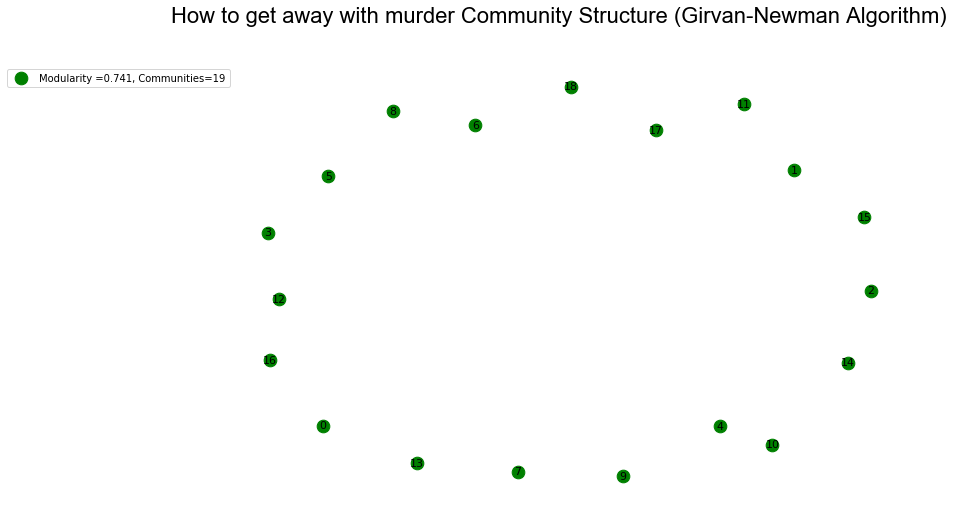

Small communities Girvan Newman Algorithm : 13
Overlapping nodes are:  0


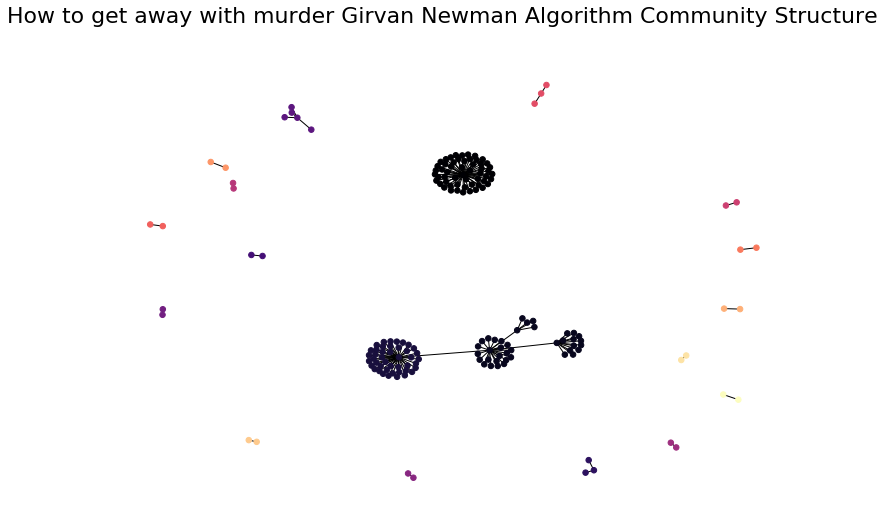

Completed Louvain algorithm .. . . 
Modularity:  0.6265277925390588
Total number of Communities= 29
Community Coverage:  0.9790575916230366
Algorithm Performance:  0.730797652684199


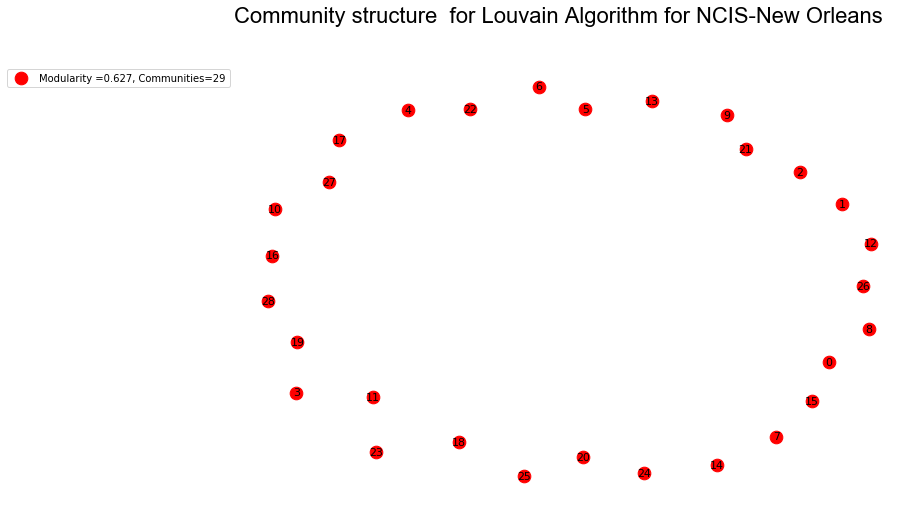

Overlapping nodes are:  0
Small communities Louvain Algorithm : 24


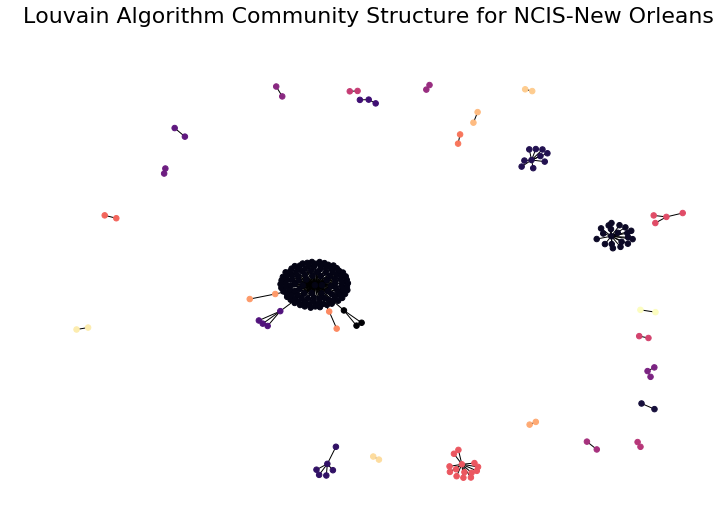

Total number of Communities= 26
Modularity: 0.6087389733234141
Community Coverage 0.9947643979057592
Algorithm Performance:  0.6968919800043469


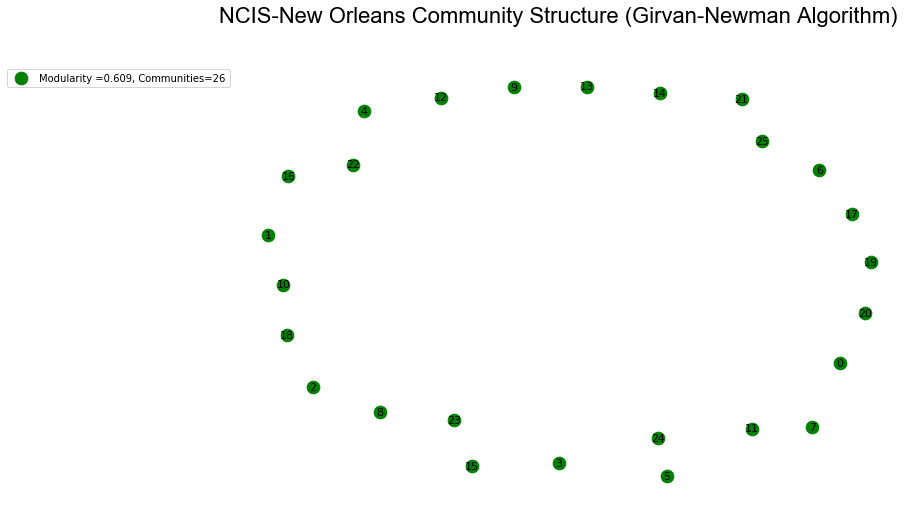

Small communities Girvan Newman Algorithm : 21
Overlapping nodes are:  0


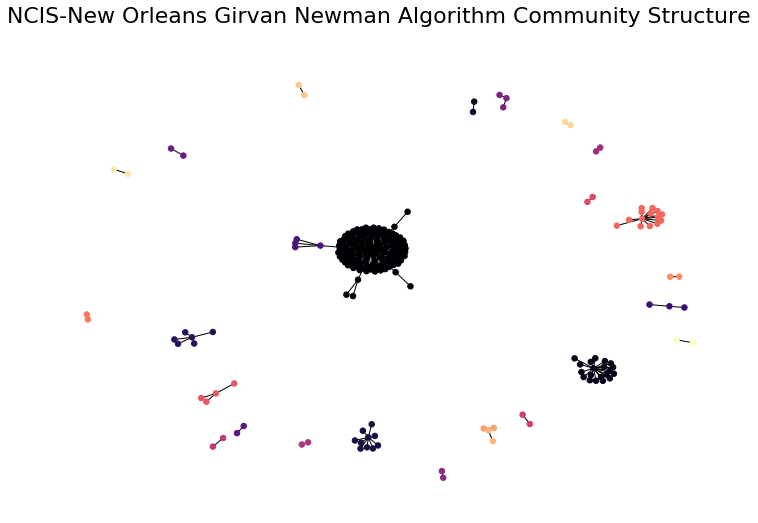

In [34]:
graphs = [gotham_graph, blackish_graph, selfie_graph, red_band_graph, ncis_graph, how_to_graph]
count = 0 
for gr in graphs:
    undirect_gr = gr.to_undirected()
    if count == 0:
        name = "Gotham"
    elif count == 1:
        name = "Blackish"
    elif count == 2:
        name = "Selfie"
    elif count == 3:
        name = "Red Band Society"
    elif count == 4:
        name = "How to get away with murder"
    elif count == 5:
        name = "NCIS-New Orleans"
    values, l_partition = louvain_community_algo(undirect_gr, name)
    overlapping_communication(l_partition)
    outlier = 0
    for k,v in l_partition.items():
        if len(l_partition[k]) < 5:
            outlier += 1
    print("Small communities Louvain Algorithm : " + str(outlier))
    
    community_graph(undirect_gr, name, values)
    
    values_girvan, g_partition = girvan_newman_algo(undirect_gr, name)
    
    # Finding outliers, i.e. communities with less than 5 nodes.
    outlier = 0
    for k,v in g_partition.items():
        if len(l_partition[k]) < 5:
            outlier += 1
    print("Small communities Girvan Newman Algorithm : " + str(outlier))
    
    # Finding overlapping nodes
    overlapping_communication(g_partition)
    draw(undirect_gr, name, values_girvan)
    
    
    count += 1

### Time series analysis of change in the structure of communities in montly basis.
The program implementation finds out if there is any change in the structure of communities over different period of times. For this implementation, I have considered changes in each month. 

graph for -09- month


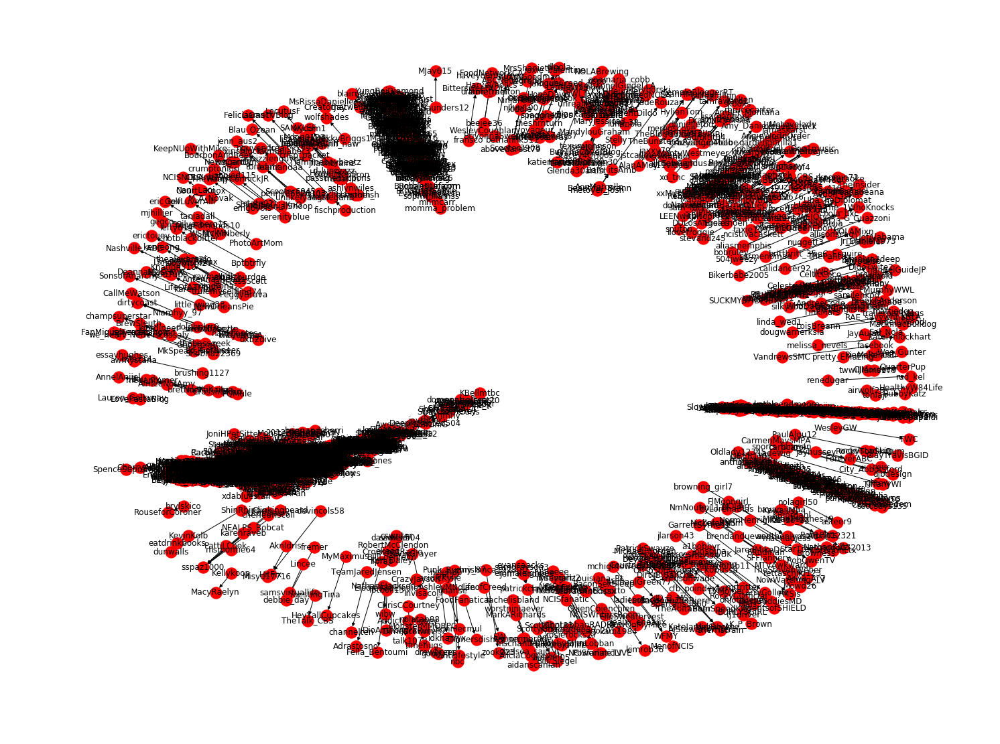

Number of self loops: 17
There are 2241 nodes and 2050 edges present.
Eigen vector centrality of top 5 nodes for NCIS :
('MerEaton', 0.9849930169918671)
('NCISfanaticLIVE', 0.053347996606718455)
('PowerlineTV', 0.05334799660671835)
('DidoTwite2', 0.04935935198897366)
('skooks', 0.03614287786662744)
closeness of top 5 nodes for NCIS :
('NCIS_CBS', 0.14476803648984024)
('M_Weatherly', 0.1339955210964543)
('MerEaton', 0.12326962886020745)
('NCISNewOrleans', 0.11210937499999998)
('lexineuman', 0.10632894404446128)
Network density of network for NCIS : 0.000408379549945815
Degree centrallity of top 5 nodes for NCIS :
('TheLucasBlack', 0.11875)
('NCISNewOrleans', 0.11116071428571428)
('M_Weatherly', 0.08794642857142856)
('ScottBakula', 0.07276785714285713)
('NOLA_Writers', 0.03794642857142857)
Out degree centrality of top 5 nodes for NCIS :
('TheSeventhBrat', 1)
('NCISfanatic', 1)
('RGE__Chaos', 1)
('NCISNewOrleans', 1)
('abnrml34', 1)
In degree centrality of top 5 nodes for NCIS :
('TheLuca

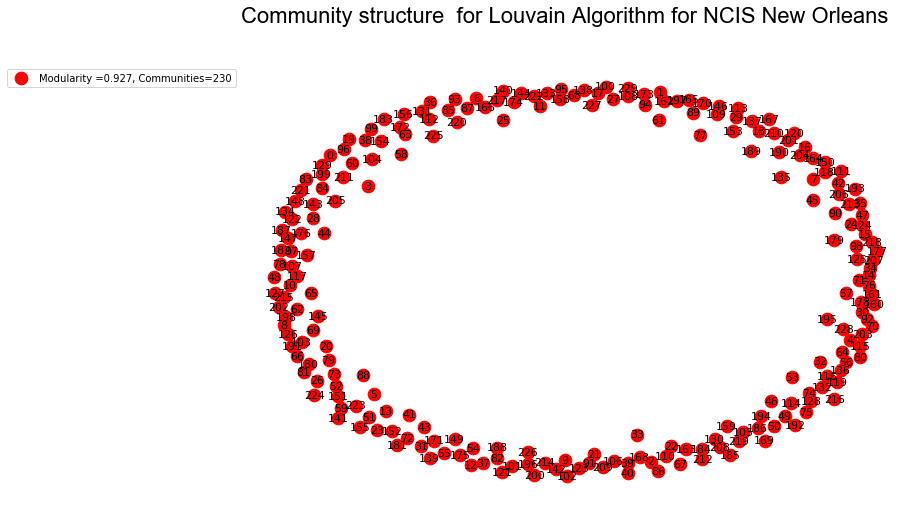

Overlapping nodes are:  0
Small communities Louvain Algorithm : 24


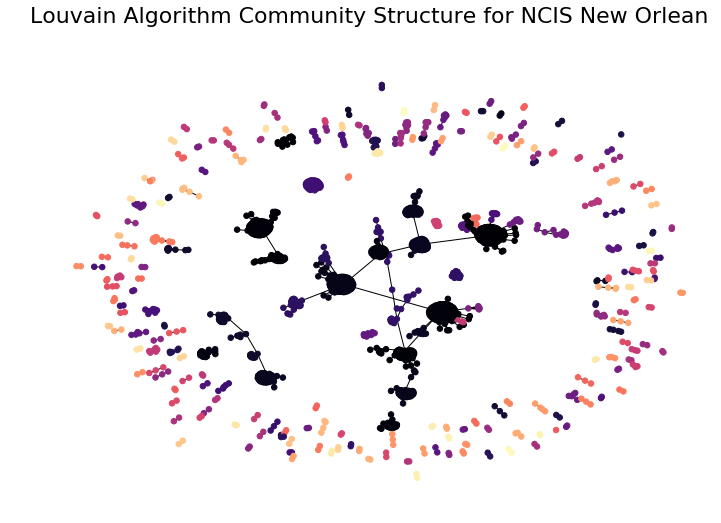

graph for -10- month


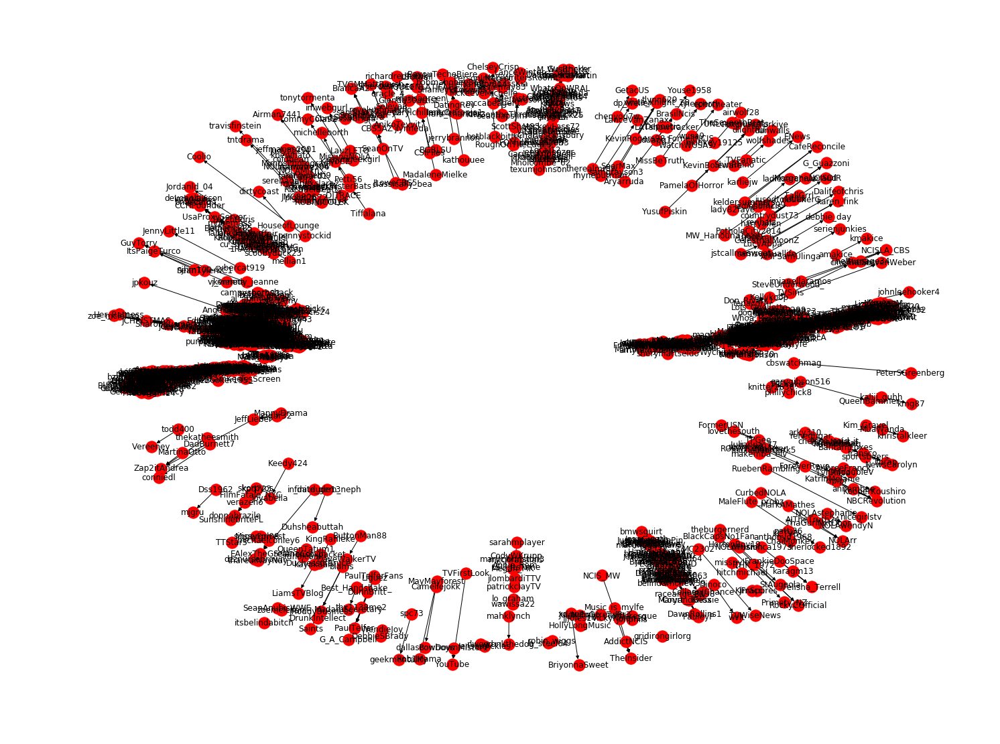

Number of self loops: 11
There are 1160 nodes and 1042 edges present.
Eigen vector centrality of top 5 nodes for NCIS :
('karen_fink', 0.6016870709000695)
('twilightreader3', 0.4250028166187055)
('TTStar5', 0.4102863341455295)
('GuyTorry', 0.3714469415448177)
('PaulTelfer', 0.08895930658210321)
closeness of top 5 nodes for NCIS :
('NCISNewOrleans', 0.17062251683001556)
('zoe_mclellan', 0.10958793991393309)
('ScottBakula', 0.10447827660107435)
('TheLucasBlack', 0.0745797312310026)
('NOLA_Writers', 0.06297397938331592)
Network density of network for NCIS : 0.0007750438844425932
Degree centrallity of top 5 nodes for NCIS :
('NCISNewOrleans', 0.1656600517687662)
('ScottBakula', 0.10267471958584988)
('TheLucasBlack', 0.07075064710957722)
('NOLA_Writers', 0.06988783433994823)
('M_Weatherly', 0.03710094909404659)
Out degree centrality of top 5 nodes for NCIS :
('tasham68', 1)
('MerEaton', 1)
('EagleScout2010', 1)
('MsStorm_ttu', 1)
('NCISNewOrleans', 1)
In degree centrality of top 5 nodes for

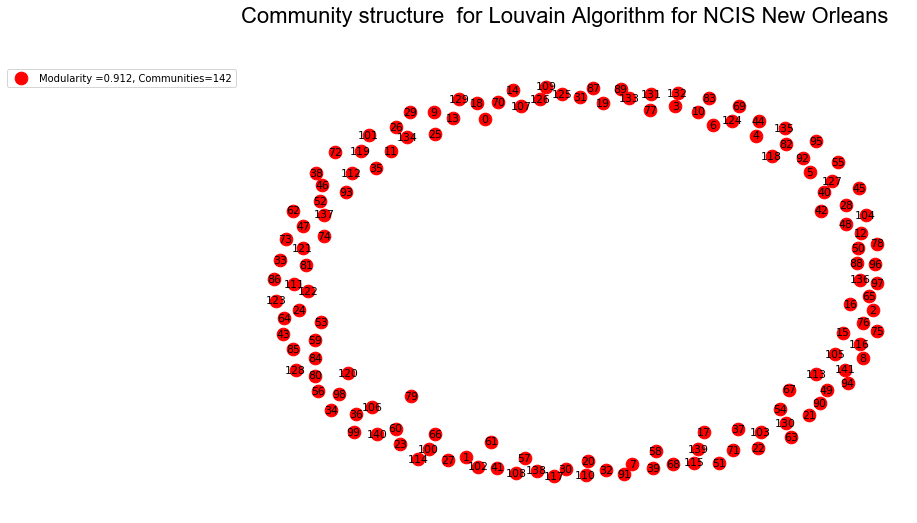

Overlapping nodes are:  0
Small communities Louvain Algorithm : 24


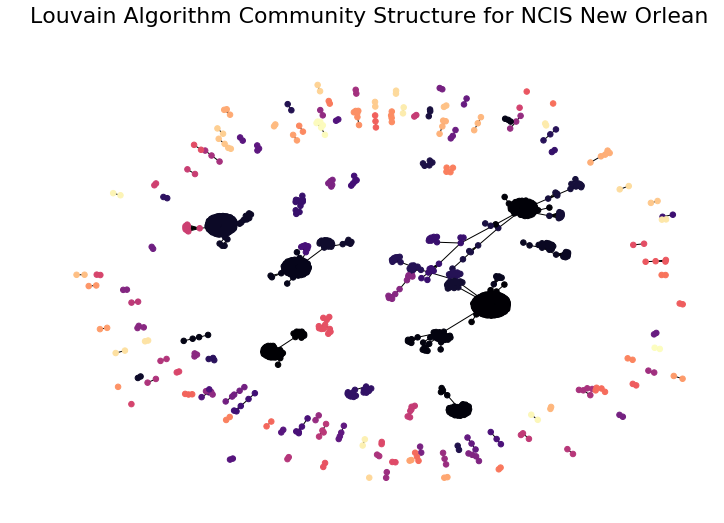

graph for -11- month


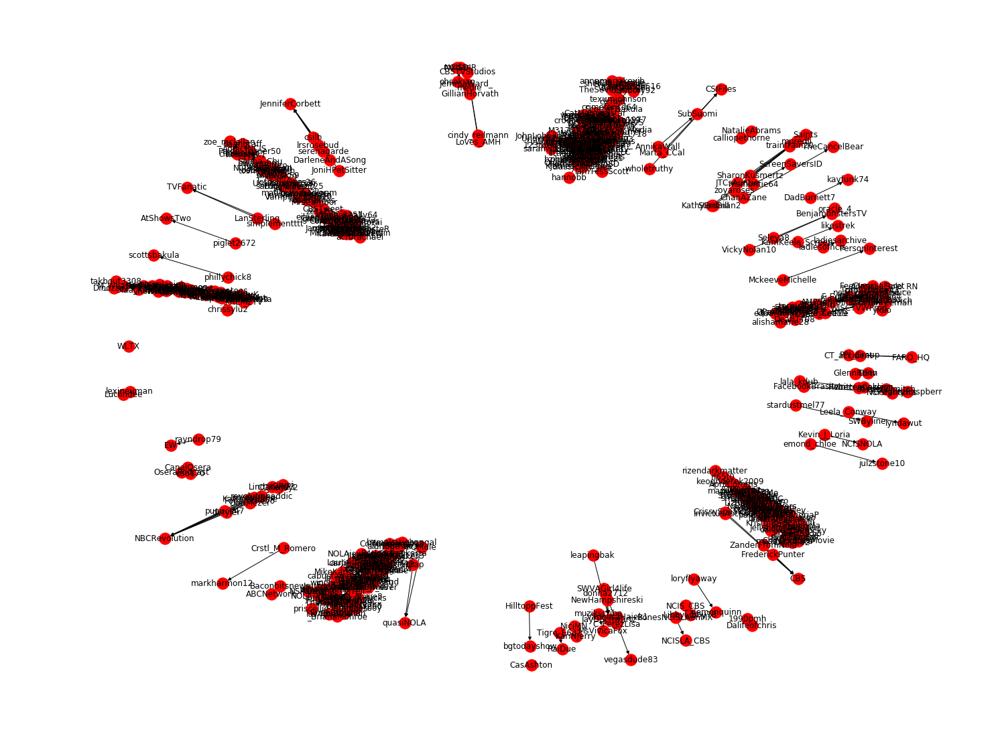

Number of self loops: 5
There are 460 nodes and 414 edges present.
Eigen vector centrality of top 5 nodes for NCIS :
('WLTX', 0.6559597390518985)
('CasAshton', 0.5900206605070375)
('SubSuomi', 0.3041407004882818)
('CCKelley2', 3.996368641946999e-17)
('ScottBakula', 3.6394880464951845e-17)
closeness of top 5 nodes for NCIS :
('NCISNewOrleans', 0.12012906428394142)
('ScottBakula', 0.10893246187363835)
('CCHPounder', 0.09431011668471069)
('zoe_mclellan', 0.09248631702003295)
('TheLucasBlack', 0.08932461873638345)
Network density of network for NCIS : 0.00196078431372549
Degree centrallity of top 5 nodes for NCIS :
('NCISNewOrleans', 0.12854030501089325)
('ScottBakula', 0.10893246187363835)
('TheLucasBlack', 0.09150326797385622)
('zoe_mclellan', 0.07843137254901962)
('M_Weatherly', 0.07625272331154685)
Out degree centrality of top 5 nodes for NCIS :
('WLTX', 1)
('vhewHauser', 1)
('garygibson516', 1)
('MarkBinda', 1)
('CBS6', 1)
In degree centrality of top 5 nodes for NCIS :
('NCISNewOrlean

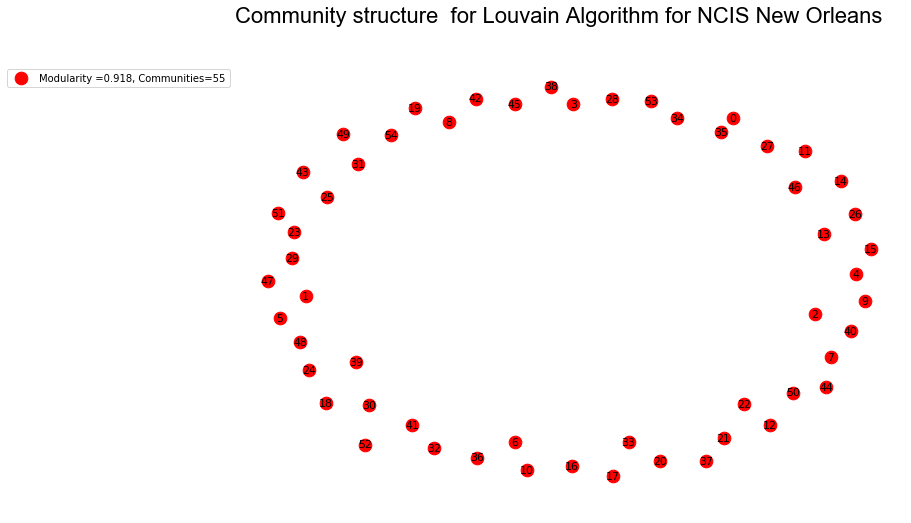

Overlapping nodes are:  0
Small communities Louvain Algorithm : 24


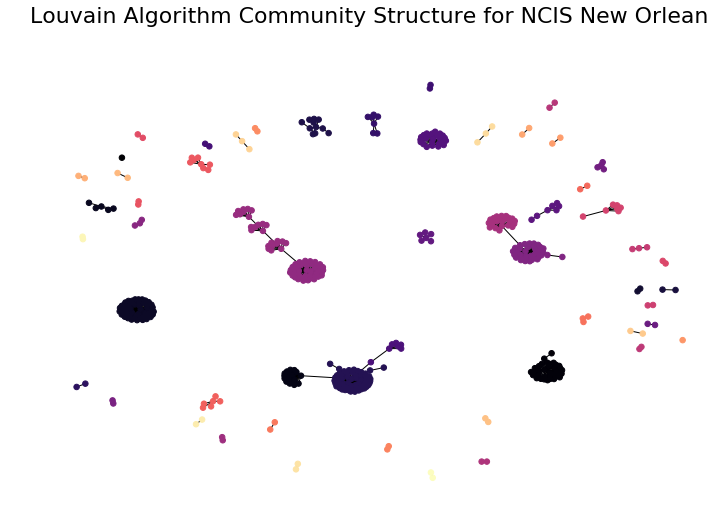

graph for -12- month


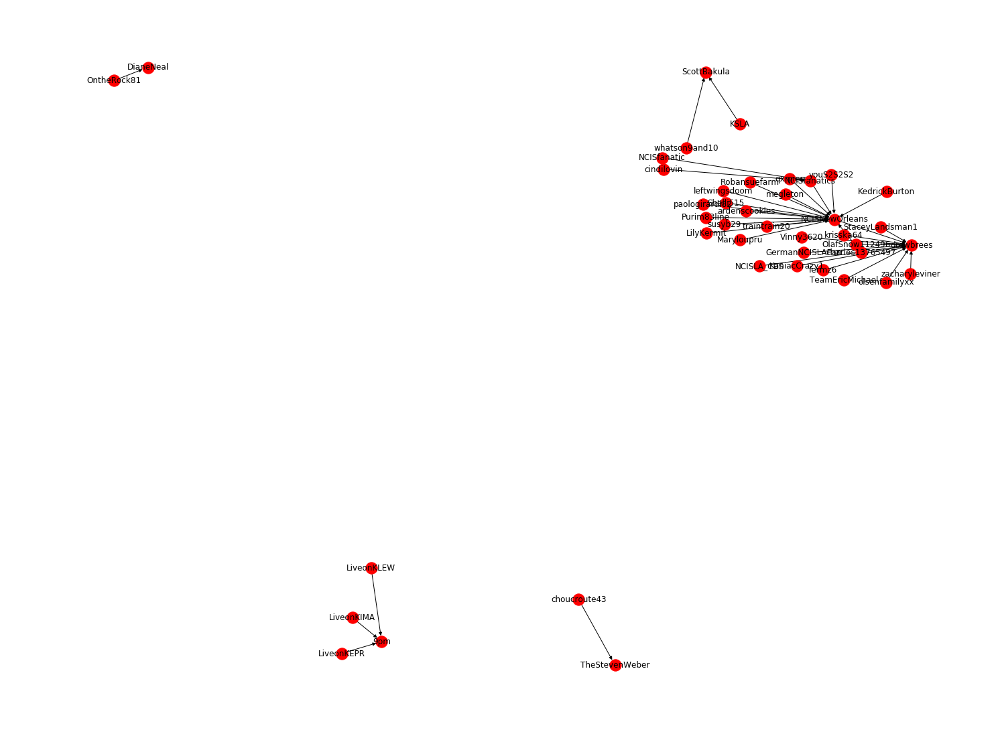

Number of self loops: 0
There are 42 nodes and 37 edges present.
Eigen vector centrality of top 5 nodes for NCIS :
('drewbrees', 0.9999999996195607)
('NCISNewOrleans', 2.7584030306606436e-05)
('TheStevenWeber', 7.412655665478569e-13)
('ScottBakula', 1.7241088524251087e-13)
('paologirardi82', 1.0206024409283328e-13)
closeness of top 5 nodes for NCIS :
('drewbrees', 0.43902439024390244)
('NCISNewOrleans', 0.3951219512195122)
('9pm', 0.07317073170731707)
('NCISfanatics', 0.04878048780487805)
('ScottBakula', 0.04878048780487805)
Network density of network for NCIS : 0.02148664343786295
Degree centrallity of top 5 nodes for NCIS :
('NCISNewOrleans', 0.41463414634146345)
('drewbrees', 0.29268292682926833)
('NCISfanatics', 0.07317073170731708)
('9pm', 0.07317073170731708)
('ScottBakula', 0.04878048780487805)
Out degree centrality of top 5 nodes for NCIS :
('choucroute43', 1)
('leftwingsdoom', 1)
('NCISNewOrleans', 1)
('traintrain20', 1)
('qxmiee', 1)
In degree centrality of top 5 nodes for NC

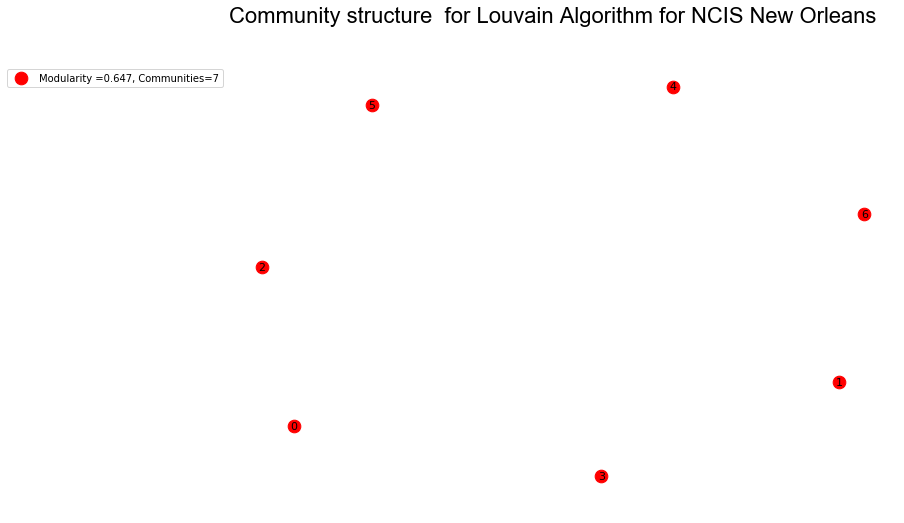

Overlapping nodes are:  0
Small communities Louvain Algorithm : 24


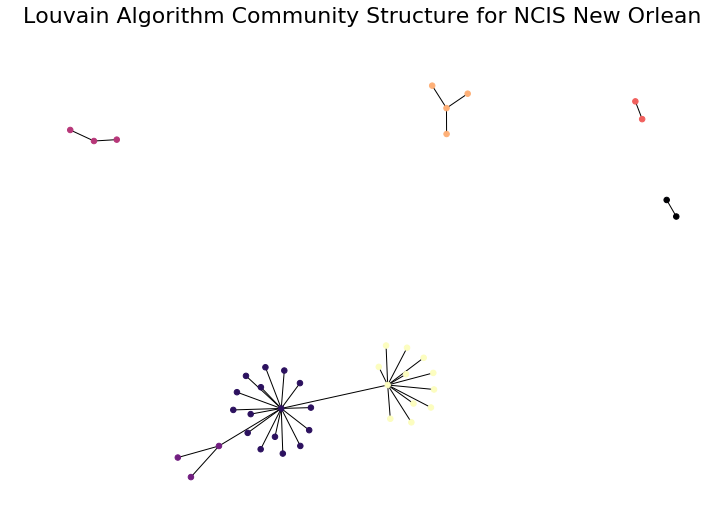

graph for -01- month


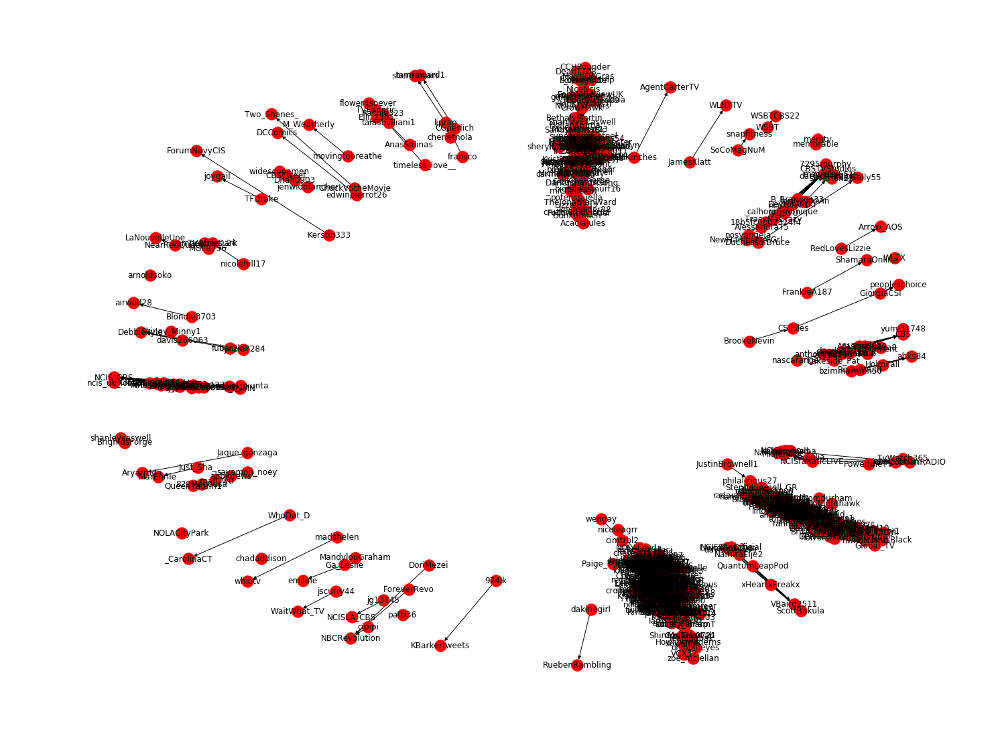

Number of self loops: 9
There are 548 nodes and 508 edges present.
Eigen vector centrality of top 5 nodes for NCIS :
('DebbiePyle', 0.4269749644925648)
('JohnLobbanRADIO', 0.41662845252069425)
('sherristrain', 0.1761263027347907)
('tamraward1', 0.17612630273479066)
('patti36', 0.1022582559453154)
closeness of top 5 nodes for NCIS :
('NCISNewOrleans', 0.19635275809448985)
('TheLucasBlack', 0.15569534612560998)
('zoe_mclellan', 0.14407016111904652)
('DianeNeal', 0.12309081771633756)
('CCHPounder', 0.07862099052684061)
Network density of network for NCIS : 0.0016947116988483967
Degree centrallity of top 5 nodes for NCIS :
('NCISNewOrleans', 0.1992687385740402)
('TheLucasBlack', 0.14990859232175502)
('zoe_mclellan', 0.09872029250457039)
('JeffLieber', 0.04204753199268738)
('CCHPounder', 0.04021937842778794)
Out degree centrality of top 5 nodes for NCIS :
('LauraGoudies', 1)
('cipipi', 1)
('DoriMezei', 1)
('RobAguire', 1)
('JeffLieber', 1)
In degree centrality of top 5 nodes for NCIS :
('NC

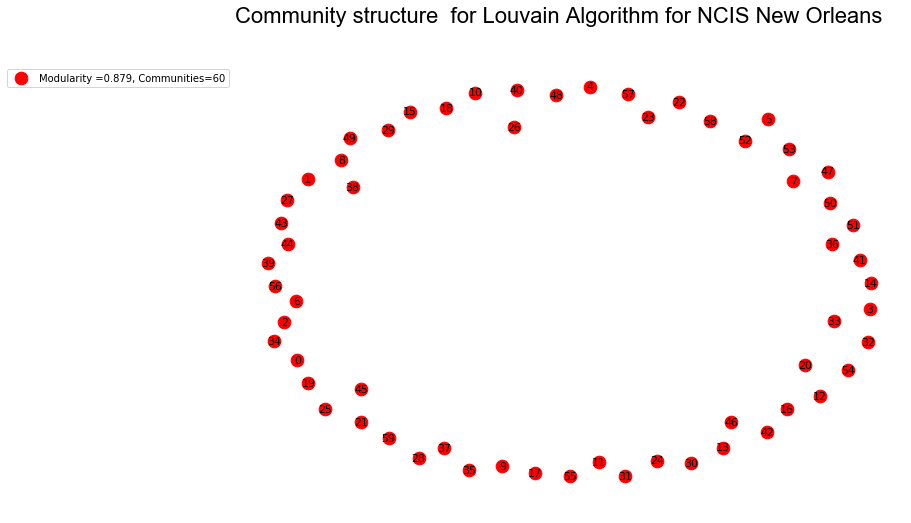

Overlapping nodes are:  0
Small communities Louvain Algorithm : 24


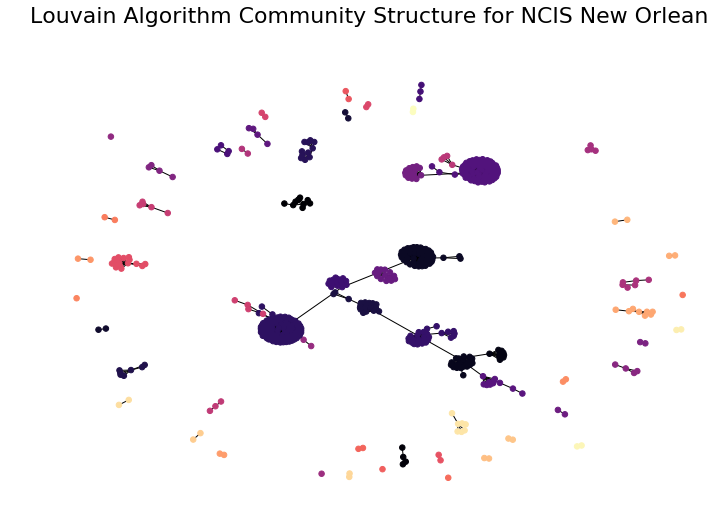

graph for -02- month


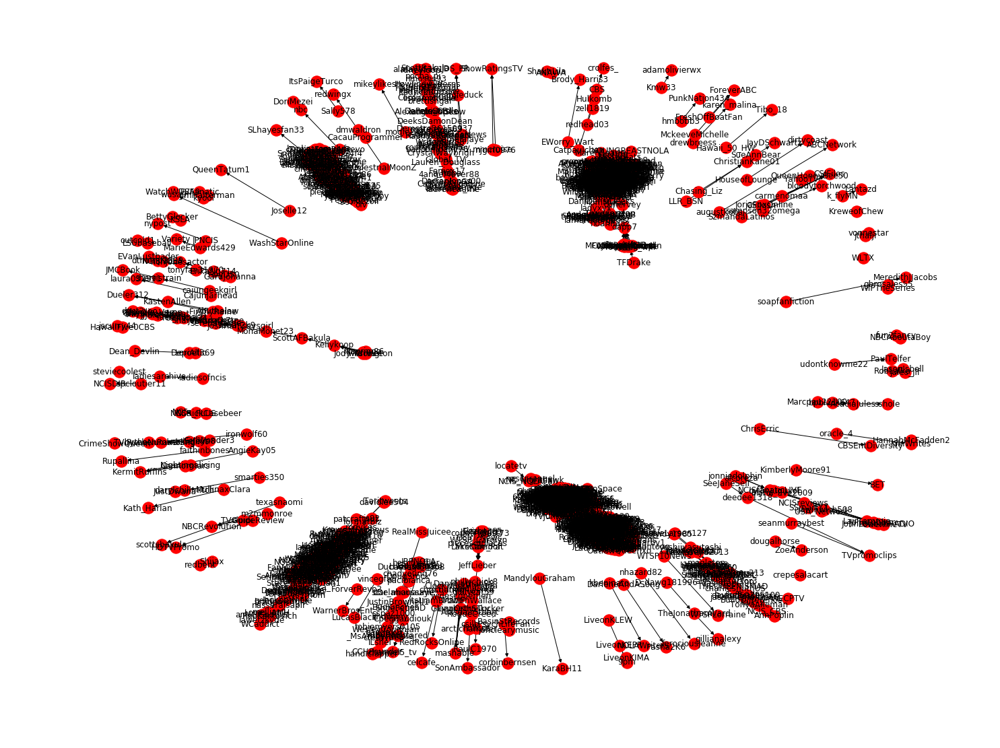

Number of self loops: 13
There are 1128 nodes and 1047 edges present.
Eigen vector centrality of top 5 nodes for NCIS :
('RobKerkovich', 0.6575518828261084)
('cimtrbl2', 0.400570229102083)
('NCISNewOrleans', 0.40057022910208284)
('dirtycoast', 0.09872673350882029)
('crepesalacart', 0.06670994628279299)
closeness of top 5 nodes for NCIS :
('NCISNewOrleans', 0.1426438076395749)
('NOLA_Writers', 0.1315217391304348)
('TheLucasBlack', 0.12077294685990338)
('cimtrbl2', 0.09543689179164182)
('MisterBats', 0.08530809425219363)
Network density of network for NCIS : 0.0008235949328852725
Degree centrallity of top 5 nodes for NCIS :
('NCISNewOrleans', 0.13842058562555457)
('NOLA_Writers', 0.13309671694764863)
('TheLucasBlack', 0.13309671694764863)
('RobKerkovich', 0.06122448979591837)
('DianeNeal', 0.04525288376220053)
Out degree centrality of top 5 nodes for NCIS :
('brokehorrorfan', 1)
('RobKerkovich', 1)
('CarlynnSunshine', 1)
('Global_TV', 1)
('a_hdpa', 1)
In degree centrality of top 5 nodes 

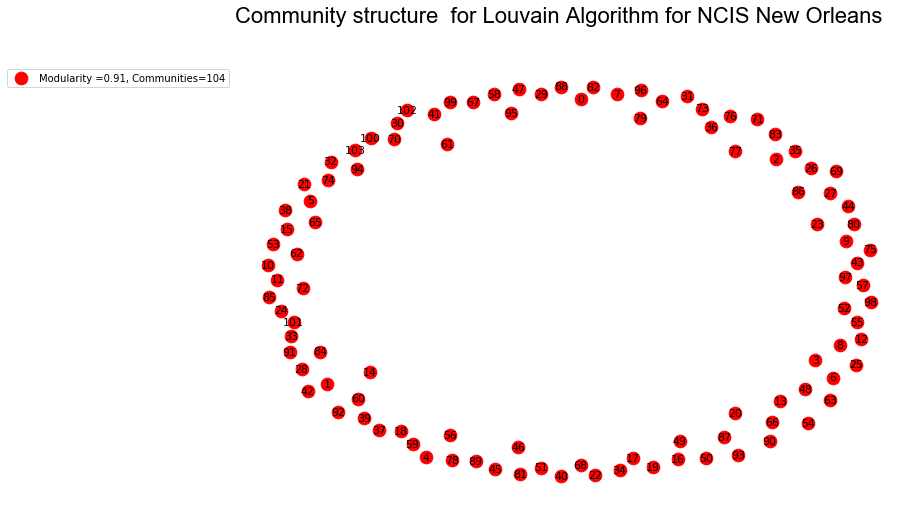

Overlapping nodes are:  0
Small communities Louvain Algorithm : 24


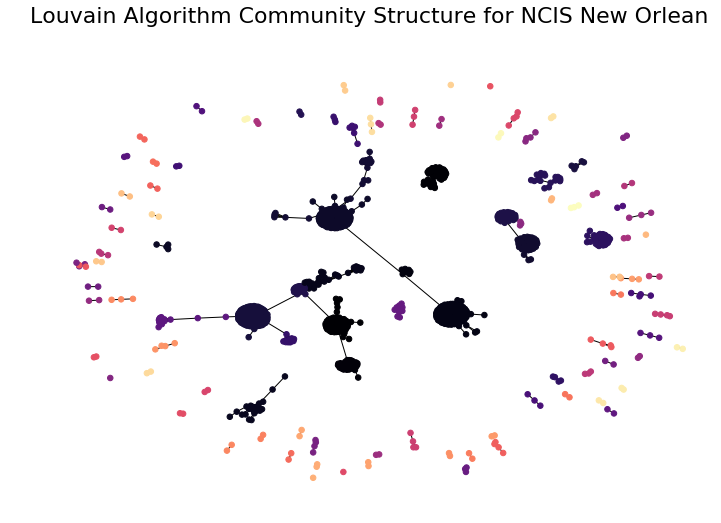

graph for -03- month


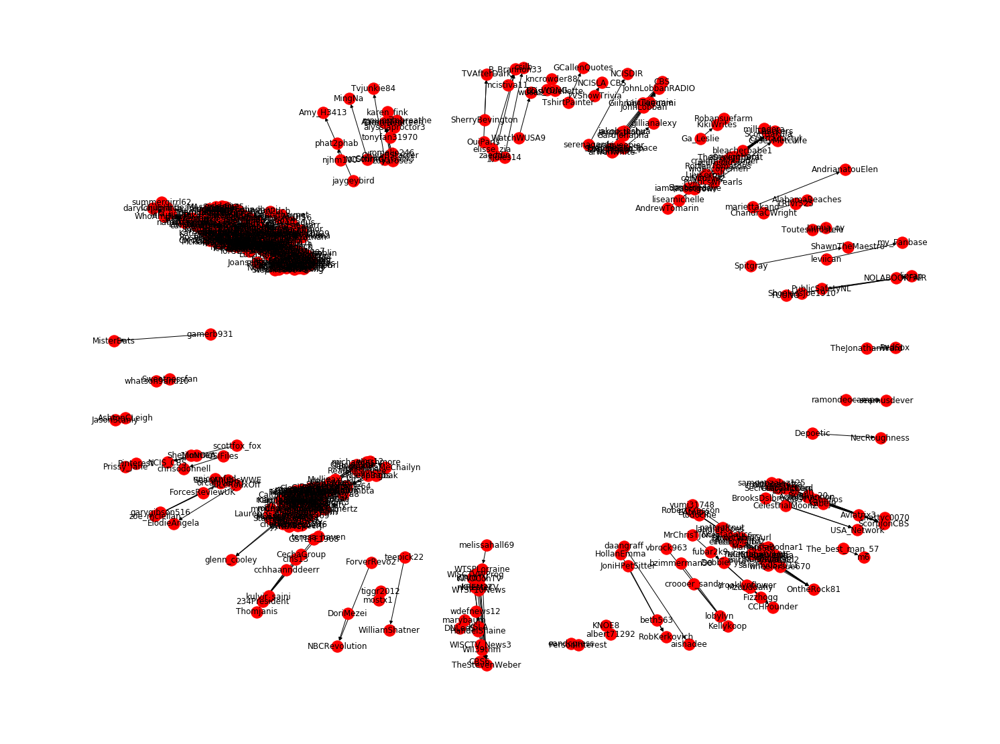

Number of self loops: 5
There are 462 nodes and 415 edges present.
Eigen vector centrality of top 5 nodes for NCIS :
('DianeNeal', 0.7860302231237368)
('OntheRock81', 0.38701359482857334)
('darylchillmitch', 0.03524176495532219)
('TheStevenWeber', 2.1068154895679453e-16)
('ScottBakula', 2.0157958554524963e-16)
closeness of top 5 nodes for NCIS :
('NCISNewOrleans', 0.15940441842343575)
('darylchillmitch', 0.14622238894416084)
('NOLA_Writers', 0.13956660777780264)
('TheLucasBlack', 0.0911062906724512)
('CajunJarhead', 0.08949069052783805)
Network density of network for NCIS : 0.001948521471298044
Degree centrallity of top 5 nodes for NCIS :
('NCISNewOrleans', 0.1561822125813449)
('NOLA_Writers', 0.14099783080260303)
('TheLucasBlack', 0.09327548806941433)
('darylchillmitch', 0.07375271149674621)
('ScottBakula', 0.039045553145336226)
Out degree centrality of top 5 nodes for NCIS :
('yumi31748', 1)
('OntheRock81', 1)
('gamerb931', 1)
('Stephieb86', 1)
('TheLucasBlack', 1)
In degree centrali

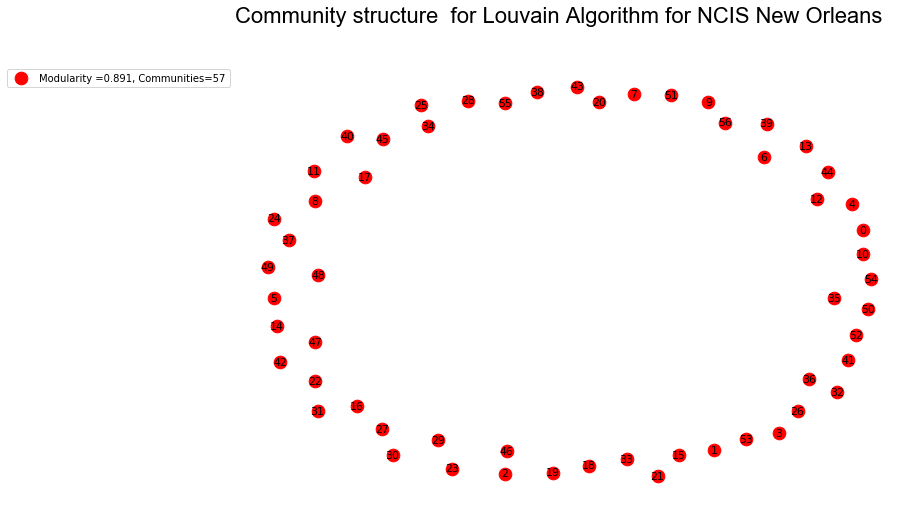

Overlapping nodes are:  0
Small communities Louvain Algorithm : 24


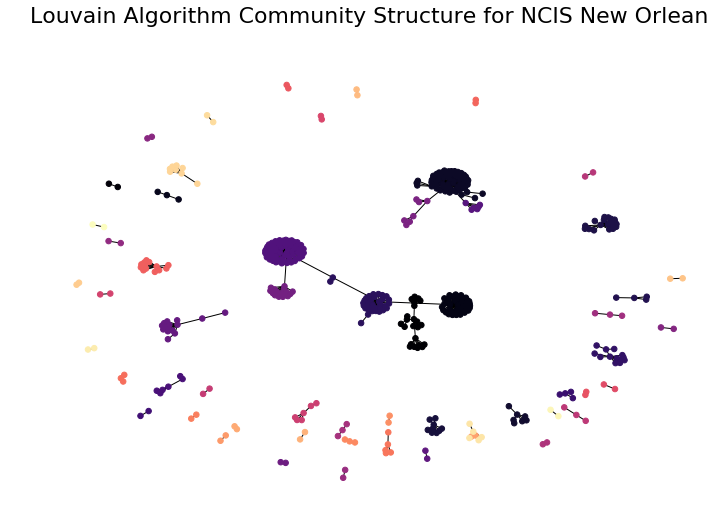

In [33]:
time_period = ['-09-', '-10-', '-11-', '-12-', '-01-', '-02-', '-03-']   
data_source = [ncis_nola]
for month in time_period:
    for source in data_source:

        retweet_timed_dict = defaultdict()
        timed_tweet_list = ""
        regex = re.compile('.*@.*', re.IGNORECASE)
        date_data = {}
        count = 0
        # Collecting tweets from dataset

        for record in source.find({'text' : regex}):
            timestamp = int(record['timestamp_ms'])/1000
            date_time = datetime.utcfromtimestamp(timestamp).strftime('%Y-%m-%d %H:%M:%S')
            date = date_time.split(" ")[0]
            # Creating month wise dictionary of interactions for graph creating
            if month in date:
                count += 1    
                mentions = record['entities']['user_mentions']
                user_name = str(record['user']['screen_name'])

                for i in range(len(mentions)):
                    user_mentioned = mentions[i]['screen_name']
                    if user_name in retweet_timed_dict:
                        check = "False"
                        for i in range(len(retweet_timed_dict[user_name])):
                            if user_mentioned in retweet_timed_dict[user_name][i]:
                                retweet_timed_dict[user_name][i][1] += 1
                                check = True
                        if check == "False":
                            retweet_timed_dict[user_name].append([user_mentioned, 1]) 
                    else:
                        retweet_timed_dict[user_name] = []
                        retweet_timed_dict[user_name].append([user_mentioned, 1]) 
        
        #identifying vertices and edged for graph creation
        vertices = retweet_timed_dict.keys()
        edge_nodes = []
        node = {}
        for key, value in retweet_timed_dict.items():
            for i in range(len(key)):
                node[i] = key
            for i in range(len(value)):
                weight_matrix = (key, value[i][0], value[i][1])
                edge_nodes.append(weight_matrix)
            
        # Creating a directed graph
        timed_graph= nx.DiGraph()
        for key in retweet_timed_dict:
            user = key
            interactions = retweet_timed_dict[key]
            #print(interactions)
            for i in range(len(interactions)):
                retweeted = interactions[i][0]
                num_times = interactions[i][1]
            timed_graph.add_edge(user, retweeted, weight=num_times)
        print("graph for " + month+ " month")
        nx.draw(timed_graph, with_labels=True)
        fig = plt.gcf()
        fig.set_size_inches(20,15)
        plt.show()    
        # Calculating different centralities
        network_info(timed_graph, "NCIS") 
        eigen_vector(timed_graph, "NCIS")
        closeness(timed_graph, "NCIS")
        in_degree(timed_graph, "NCIS")
        between(timed_graph, "NCIS") 
        
        undirect_timed_gr = timed_graph.to_undirected()
        # Finding communities
        timed_values, partition = louvain_community_algo(undirect_timed_gr, "NCIS New Orleans")
        # Finding overlapping nodes
        overlapping_communication(partition)
        # Finding outliers where number of nodes in community are less than 5
        outlier = 0
        for k,v in l_partition.items():
            if len(l_partition[k]) < 5:
                outlier += 1
        print("Small communities Louvain Algorithm : " + str(outlier))
    
        community_graph(undirect_timed_gr, "NCIS New Orlean", timed_values)  